### <font color='289C4E'>Table of contents<font><a class='anchor' id='top'></a>
* [1. Introduction](#1)
    * [1.1 Data Loading and Module Importing](#1.1)
    * [1.2 Analysis of Cancer Label Distribution](#1.2)
    * [1.3 Distribution of `radius_mean` with outlier](#1.3)
    * [1.4 Distribution of `features` with outlier](#1.4)
    * [1.5 Joint Plot Distribution of `concavity_worst` with `concave points_worst`](#1.5)
    * [1.6 Joint Plot Distribution(boxplot) of `concavity_worst` with `concave points_worst`](#1.6)
    * [1.7 Joint Plot Distribution For Each diagnosis  of `concavity_worst` with `concave points_worst`](#1.7)
    * [1.8 Joint Plot Distribution For Each diagnosis  of `radius_mean` with `area_mean`](#1.8)
    * [1.9 Joint Plot Distribution For Each diagnosis  of `radius_mean` with `perimeter_mean`](#1.9)
    * [1.10 Joint Plot Distribution(regression) For Each diagnosis  of `radius_mean` with `perimeter_mean`](#1.10)
    * [1.11 Joint Plot Distribution(regression) For Each diagnosis  of `concavity_worst` with `concave points_worst`](#1.11)
    * [1.12 PairGrid Plot Distribution Between `radius_worst`,`perimeter_worst`,`area_worst`](#1.12)
    * [1.13 Corelation Plot Between `Features`](#1.13)
   
* [2. Insight Generation from The Dataset](#2)
   * [2.1 Distribution of Benine and Malignenet Tumor With Available Data](#2.1)
   * [2.2 Distribution of `radius_mean` of Benine and Malignenet Tumor With Available Data](#2.2)
       * [2.2.1 Statistical Analysis of `radius_mean` of Benine and Malignenet Tumor With Available Data](#2.2.1)
       * [2.2.2 Descriptive Statistical Analysis of `radius_mean` of Benine Tumor With Available Data](#2.2.2)
       * [2.2.3 CDF of bening tumor `radius_mean` With Available Data](#2.2.3)
   * [2.3 Corelation Plot Of `Mean` Features ](#2.3) 
   * [2.4 Corelation Plot Of `radius_mean` and features with .75 Threshold](#2.4)
   * [2.5 Corelation Plot Of `texture_mean` and features with .25 Threshold](#2.5)
   * [2.6 Corelation Plot Of `symmetry_mean` and features with .5 Threshold](#2.6)
* [3. Analysis Of Patient Data](#3)
   * [3.1 Visualization Of Patient Data with Important Features ](#3.1)
   * [3.2 Visualization Of End Result of Patient data](#3.2)
   * [3.3 Visualization Of `Grade` VS `Eventdeath` Analysis ](#3.3)
   * [3.4 Visualization Of `Grade` VS `Chemo` Analysis](#3.4)
   * [3.5 Visualization Of `Chemo` VS `Eventdeath` Analysis ](#3.5)
   * [3.6 Visualization Of `grade` VS `Eventdeath` Analysis](#3.6)
   * [3.7 Counter Plot Of `age`,`survival` and `diameter`](#3.7)
   * [3.8 Mesh Plot Of `age`,`survival` and `diameter`](#3.8)
   * [3.9 Joint Plot Of `age` and `survival`](#3.9)
   * [3.10 Joint Plot Of `diam` and `survival`](#3.10)
   * [3.11 Joint Plot Of `diam` and `survival` with counters](#3.11)
   * [3.12 Joint Plot Of `age` and `survival` with counters ](#3.12)
   * [3.13 Joint Plot Of `age` and `survival` with scatters](#3.13)
   * [3.14 Joint Plot Of `diam` and `survival` with scatters ](#3.14)
   * [3.15 HeatMap Of `Age` and `survival` with scatters](#3.15)
   * [3.16 Hisogram Of Age Of Patients ](#3.16)
   * [3.17 Hisogram Of Age Of Patients With Target](#3.17)
   * [3.18 Hisogram Of Age And Grade](#3.18)
   * [3.19 Hisogram Of Age And Death](#3.19)
   * [3.20 Hisogram Of Age And Grade](#3.20)
   * [3.21 Hisogram Of `Survival` And `Grade`](#3.21)
   * [3.22 Hisogram Of Different Features and Analysis](#3.22)
* [4. Outlier Detection](#4)
* [5. Machine Learning Section](#5)
    * [5.1 Test-Train Split and Scaling of Training Data ](#5.1)
    * [5.2 KNN Model and Its Performence](#5.2)
       * [5.2.1 KNN Model's Performence Matrix](#5.2.1)
       * [5.2.2 KNN Model's Best Performence Matrix](#5.2.2)
       * [5.2.3 Optimal Feature Selection](#5.2.3)
       * [5.2.4 Feature Importance plot for RandomForest Model](#5.2.4)
    * [5.3 Dimension Reduction Using T-SNE](#5.3)
    * [5.4 Dimension Reduction Using PCA](#5.4)
    * [5.5 Dimension Reduction Using NCA](#5.5)


# 1. Introduction to Breast Cancer Detection and Analysis With Open Data Source<a class= 'anchor' id='1'></a>

Breast cancer is a significant health concern affecting millions of women worldwide. Early detection plays a crucial role in improving treatment outcomes and reducing mortality rates. With advancements in technology and the availability of open data sources, researchers and medical professionals have a powerful tool at their disposal for breast cancer detection and analysis. Open data sources provide access to a wealth of information, including mammography images, patient records, and genetic data, enabling researchers to develop innovative methods for early detection, risk assessment, and personalized treatment strategies. By leveraging these open data sources, scientists can collaborate, analyze large datasets, and develop new insights to enhance breast cancer diagnosis and improve patient outcomes. In this article, we will explore the potential of open data sources in breast cancer detection and analysis, highlighting their importance in advancing research, promoting data transparency, and ultimately contributing to the fight against this devastating disease. 



## 1.1 Data Loading and Module Importing<a class= 'anchor' id='1.1'></a>



In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import yellowbrick as yb
import plotly.express as px
# Import the necessaries libraries
import plotly.offline as pyo
import plotly.graph_objs as go
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier, NeighborhoodComponentsAnalysis, LocalOutlierFactor
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.neighbors import KNeighborsClassifier, NeighborhoodComponentsAnalysis, LocalOutlierFactor
from sklearn.decomposition import PCA
from matplotlib.colors import ListedColormap
# Set notebook mode to work in offline
pyo.init_notebook_mode()

numpy and pandas are widely used for data manipulation and analysis. matplotlib and seaborn are popular visualization libraries that offer a range of plotting options. yellowbrick is a library for visual machine learning analysis and model evaluation. plotly and its sub-modules, plotly.offline and plotly.graph_objs, provide interactive and dynamic visualizations. Lastly, train_test_split from sklearn.model_selection is used for splitting data into training and testing sets. By initializing plotly in notebook mode, we can work with these visualizations offline within our Jupyter Notebook or other similar environments.

Now we are ready to analyze and visualize your breast cancer data using these libraries!

Next, we are loading the data for doing the analysis and also the patient data as well as the world statistics data .

In [2]:
data = pd.read_csv('dataset/archive/data.csv')

In [3]:
patient_data = pd.read_csv('dataset/NKI_cleaned.csv')

In [4]:
pd.set_option('display.max_columns', 30)
data.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,perimeter_se,...,concavity_se,concave points_se,symmetry_se,fractal_dimension_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,1.0950,0.9053,8.589,...,0.05373,0.01587,0.03003,0.006193,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,NaN
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,0.5435,0.7339,3.398,...,0.01860,0.01340,0.01389,0.003532,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,NaN
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,0.7456,0.7869,4.585,...,0.03832,0.02058,0.02250,0.004571,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,NaN
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,0.4956,1.1560,3.445,...,0.05661,0.01867,0.05963,0.009208,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,NaN
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,0.7572,0.7813,5.438,...,0.05688,0.01885,0.01756,0.005115,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,NaN


In [5]:
world_statistics =  pd.read_csv('dataset/archive (1)/Worldwide Cancer Dataset.csv')
world_statistics_male =  pd.read_csv('dataset/archive (1)/Worldwide Cancer Dataset (Males) .csv')
world_statistics_female =  pd.read_csv('dataset/archive (1)/Worldwide Cancer Dataset (Females) .csv')

In [6]:
world_statistics.head()

,Rank,Cancer,New cases in 2020,% of all cancers
0,NaN,All cancers*,"18,094,716",NaN
1,1.0,Breast,"2,261,419",12.5
2,2.0,Lung,"2,261,771",12.2
3,3.0,Colorectal**,"1,931,590",10.7
4,4.0,Prostate,"1,414,259",7.8


In [7]:
world_statistics_male.head()


,Rank,Cancer,New cases in 2020,% of all cancers
0,NaN,All cancers*,"9,342,957",NaN
1,1.0,Lung,"1,435,943",15.4
2,2.0,Prostate,"1,414,259",15.1
3,3.0,Colorectal**,"1,065,960",11.4
4,4.0,Stomach,"719,523",7.7


In [8]:
world_statistics_female.head()

,Rank,Cancer,New cases in 2020,% of all cancers
0,NaN,All cancers*,"8,751,759",NaN
1,1.0,Breast,"2,261,419",25.8
2,2.0,Colorectal **,"865,630",9.9
3,3.0,Lung,"770,828",8.8
4,4.0,Cervix uteri,"604,127",6.9


We can easily identify for all over world , overall as well as for females the Breast Cancer is the NO.1 type of cancer.

In [9]:
data = data.drop('Unnamed: 32',axis=1)

Let's drop the column <b>'Unnamed: 32'</b> from the dataset named 'data'. By using the `drop()` function with the `axis=1` parameter, we have removed the column along the horizontal axis (columns) of the dataset.

This step is useful when dealing with datasets that contain unnecessary or irrelevant columns.

In [10]:
# feature names as a list
col = data.columns       # .columns gives columns names in data 
print(col)

Index(['id', 'diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean',
       'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean',
       'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se',
       'fractal_dimension_se', 'radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave points_worst',
       'symmetry_worst', 'fractal_dimension_worst'],
      dtype='object')


In [11]:
# y includes our labels and x includes our features
y = data.diagnosis                          # M or B 
list = ['id','diagnosis']
x = data.drop(list,axis = 1 )
x.head()

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,perimeter_se,area_se,smoothness_se,compactness_se,concavity_se,concave points_se,symmetry_se,fractal_dimension_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,1.0950,0.9053,8.589,153.40,0.006399,0.04904,0.05373,0.01587,0.03003,0.006193,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,0.5435,0.7339,3.398,74.08,0.005225,0.01308,0.01860,0.01340,0.01389,0.003532,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,0.7456,0.7869,4.585,94.03,0.006150,0.04006,0.03832,0.02058,0.02250,0.004571,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,0.4956,1.1560,3.445,27.23,0.009110,0.07458,0.05661,0.01867,0.05963,0.009208,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,0.7572,0.7813,5.438,94.44,0.011490,0.02461,0.05688,0.01885,0.01756,0.005115,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [12]:
y.head()

0    M
1    M
2    M
3    M
4    M
Name: diagnosis, dtype: object

## 1.2 Analysis of Cancer Label Distribution<a class= 'anchor' id='1.2'></a>



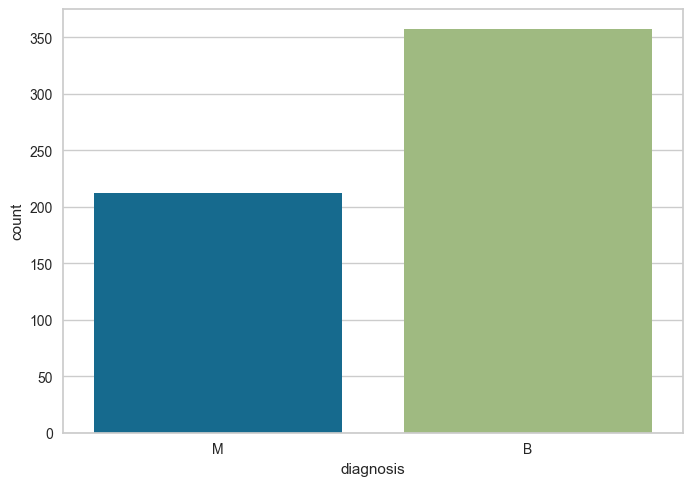

In [13]:
ax = sns.countplot(x=y,label="Count")       # M = 212, B = 357

This plot is used to visualize the distribution of categorical variable/traget variable and to observe the frequency of each category in the dataset. By examining the countplot, we can gain insights into the distribution and imbalance of different categories within the variable `diagnosis`.

In [14]:
B, M = y.value_counts()
print('Number of Benign: ',B)
print('Number of Malignant : ',M)

Number of Benign:  357
Number of Malignant :  212


In [15]:
fig = px.pie(y, values=y.value_counts().values, names=y.value_counts().index)
fig.update_traces(hoverinfo='label+percent', textinfo='value')
fig.show()

same plot we are seeing now with pie plot.

In [16]:
x.describe()

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,perimeter_se,area_se,smoothness_se,compactness_se,concavity_se,concave points_se,symmetry_se,fractal_dimension_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
count,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,0.062798,0.405172,1.216853,2.866059,40.337079,0.007041,0.025478,0.031894,0.011796,0.020542,0.003795,16.269190,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946
std,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,0.007060,0.277313,0.551648,2.021855,45.491006,0.003003,0.017908,0.030186,0.006170,0.008266,0.002646,4.833242,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061
min,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,0.049960,0.111500,0.360200,0.757000,6.802000,0.001713,0.002252,0.000000,0.000000,0.007882,0.000895,7.930000,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040
25%,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,0.057700,0.232400,0.833900,1.606000,17.850000,0.005169,0.013080,0.015090,0.007638,0.015160,0.002248,13.010000,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460
50%,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,0.061540,0.324200,1.108000,2.287000,24.530000,0.006380,0.020450,0.025890,0.010930,0.018730,0.003187,14.970000,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040
75%,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,0.066120,0.478900,1.474000,3.357000,45.190000,0.008146,0.032450,0.042050,0.014710,0.023480,0.004558,18.790000,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080
max,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,0.097440,2.873000,4.885000,21.980000,542.200000,0.031130,0.135400,0.396000,0.052790,0.078950,0.029840,36.040000,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500


we generate a summary statistics table that includes various statistical measures such as count, mean, standard deviation, minimum, quartiles, and maximum. It provides a quick overview of the distribution and central tendency of the data in the dataframe.

In [17]:
def box_plot_visualization(data,col,points,y):
    fig = px.box(data,y = col,points=points,color=y )
    return fig.show()

The function `box_plot_visualization` takes four parameters: `data`, `col`, `points`, and `y`. Here's a breakdown of what the function does:

- `data`: The dataset or DataFrame containing the data.
- `col`: The column in the dataset on which the box plot will be based.
- `points`: A parameter that specifies whether or not to show individual data points on the box plot. If set to `True`, individual data points will be displayed.
- `y`: The column in the dataset that represents the categorical variable for grouping or coloring the box plot.


## 1.3 Distribution of `radius_mean` with outlier<a class= 'anchor' id='1.3'></a>

In [18]:
box_plot_visualization(data,"radius_mean","outliers","diagnosis")

The median of `radius_mean` for Malignent type is 17.325 and for Benine type is 12.2. For Malignent the upper fence is 25.73 and for Benine is 16.5.

In [19]:
box_plot_visualization(data,"radius_mean","all","diagnosis")

## 1.4 Distribution of `features` with outlier<a class= 'anchor' id='1.4'></a>

In [20]:

box_plot_visualization(data,"radius_mean","outliers","diagnosis")
box_plot_visualization(data,"texture_mean","outliers","diagnosis")
box_plot_visualization(data,"perimeter_mean","outliers","diagnosis")
box_plot_visualization(data,"area_mean","outliers","diagnosis")
box_plot_visualization(data,"smoothness_mean","outliers","diagnosis")
box_plot_visualization(data,"compactness_mean","outliers","diagnosis")
box_plot_visualization(data,"concavity_mean","outliers","diagnosis")
box_plot_visualization(data,"concave points_mean","outliers","diagnosis")
box_plot_visualization(data,"symmetry_mean","outliers","diagnosis")
box_plot_visualization(data,"fractal_dimension_mean","outliers","diagnosis")

## 1.5 Joint Plot Distribution of `concavity_worst` with `concave points_worst`<a class= 'anchor' id='1.5'></a>

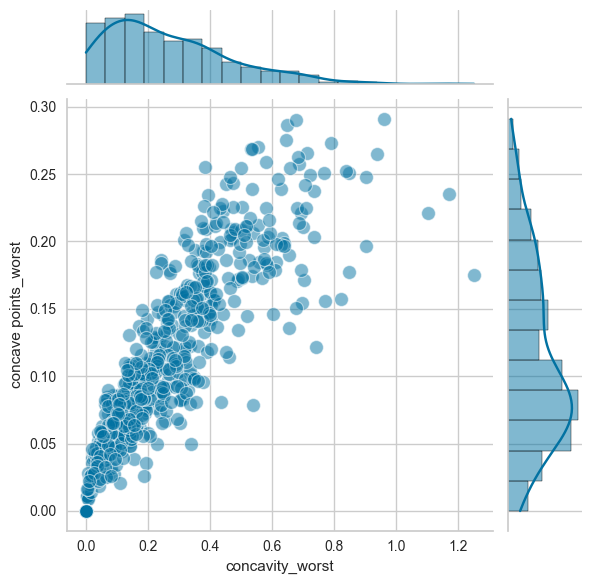

In [21]:
g = sns.JointGrid(data=data, x="concavity_worst", y="concave points_worst")
g.plot_joint(sns.scatterplot, s=100, alpha=.5)
g.plot_marginals(sns.histplot, kde=True)

A JointGrid plot allows you to visualize the joint distribution between two variables by combining a scatter plot and histograms for each variable along the axes. In this case, the plot will represent the relationship between the "concavity_worst" variable on the x-axis and the "concave points_worst" variable on the y-axis.

## 1.6 Joint Plot Distribution(boxplot) of `concavity_worst` with `concave points_worst`<a class= 'anchor' id='1.6'></a>

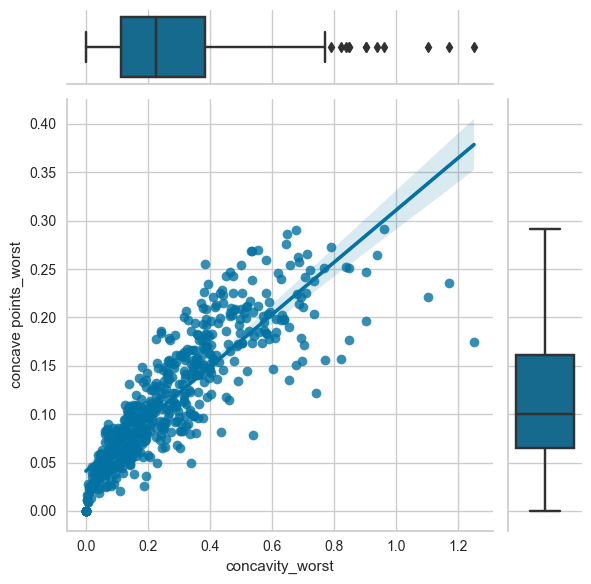

In [22]:
g = sns.JointGrid(data=data, x="concavity_worst", y="concave points_worst")
g.plot(sns.regplot, sns.boxplot)

## 1.7 Joint Plot Distribution For Each diagnosis  of `concavity_worst` with `concave points_worst`<a class= 'anchor' id='1.7'></a>

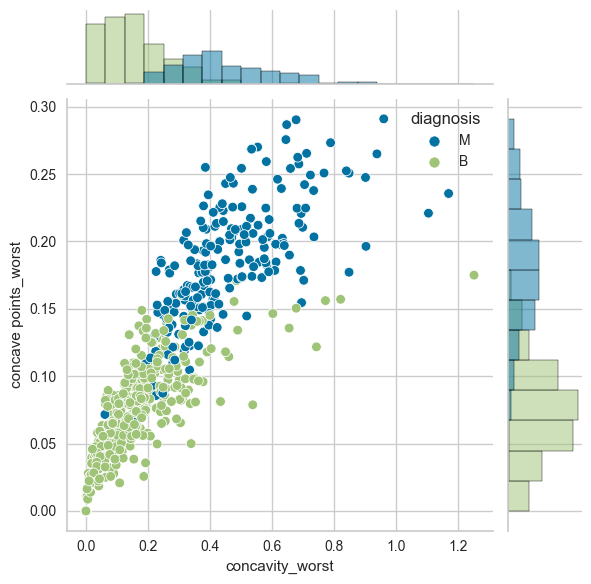

In [23]:
g = sns.JointGrid(data=data, x="concavity_worst", y="concave points_worst", hue="diagnosis")
g.plot(sns.scatterplot, sns.histplot)

## 1.8 Joint Plot Distribution For Each diagnosis  of `radius_mean` with `area_mean`<a class= 'anchor' id='1.8'></a>

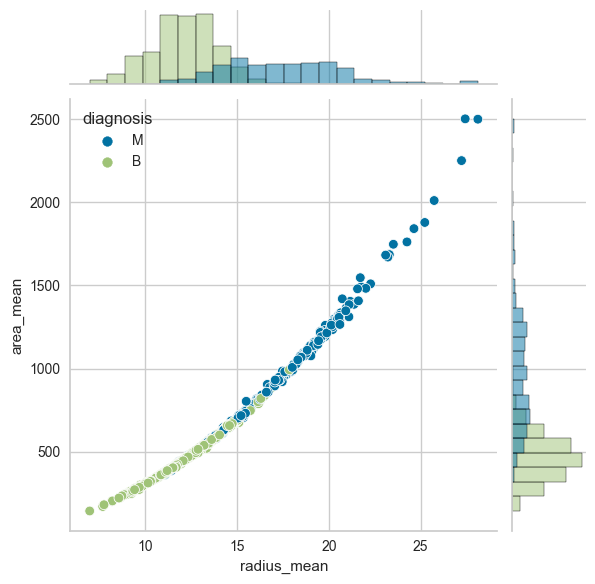

In [24]:
g = sns.JointGrid(data=data, x="radius_mean", y="area_mean", hue="diagnosis")
g.plot(sns.scatterplot, sns.histplot)

## 1.9 Joint Plot Distribution For Each diagnosis  of `radius_mean` with `perimeter_mean`<a class= 'anchor' id='1.9'></a>

<Figure size 1500x1000 with 0 Axes>

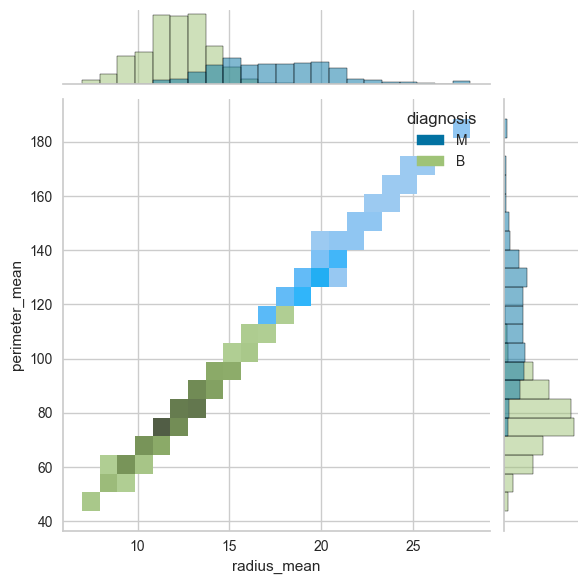

In [25]:
#['scatter', 'hist', 'hex', 'kde', 'reg', 'resid']
plt.figure(figsize = (15,10))
sns.jointplot(data=data,x='radius_mean',y='perimeter_mean',kind="hist",hue="diagnosis")
plt.show()

## 1.10 Joint Plot Distribution(regression) For Each diagnosis  of `radius_mean` with `perimeter_mean`<a class= 'anchor' id='1.10'></a>

<Figure size 1500x1000 with 0 Axes>

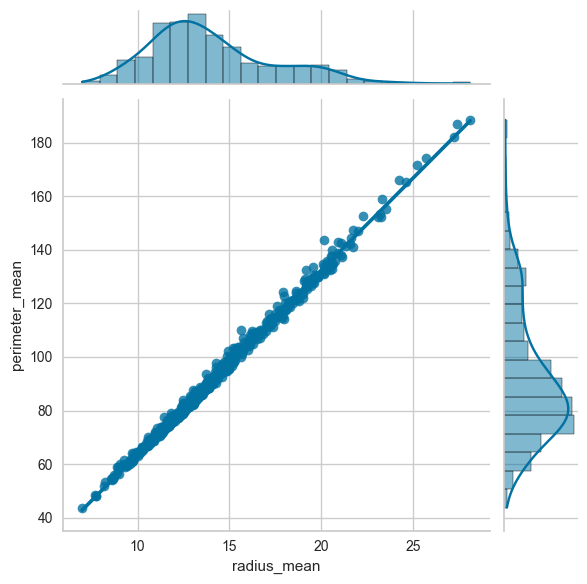

In [26]:
#['scatter', 'hist', 'hex', 'kde', 'reg', 'resid']
plt.figure(figsize = (15,10))
sns.jointplot(data=data,x='radius_mean',y='perimeter_mean',kind="reg")
plt.show()

<Figure size 1500x1000 with 0 Axes>

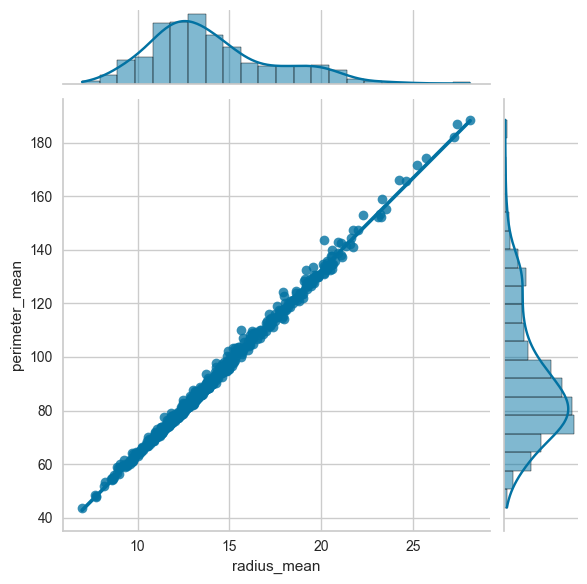

In [27]:
#['scatter', 'hist', 'hex', 'kde', 'reg', 'resid']
plt.figure(figsize = (15,10))
sns.jointplot(data=data,x='radius_mean',y='perimeter_mean',kind="reg")
plt.show()

## 1.11 Joint Plot Distribution(regression) For Each diagnosis  of `concavity_worst` with `concave points_worst`<a class= 'anchor' id='1.11'></a>

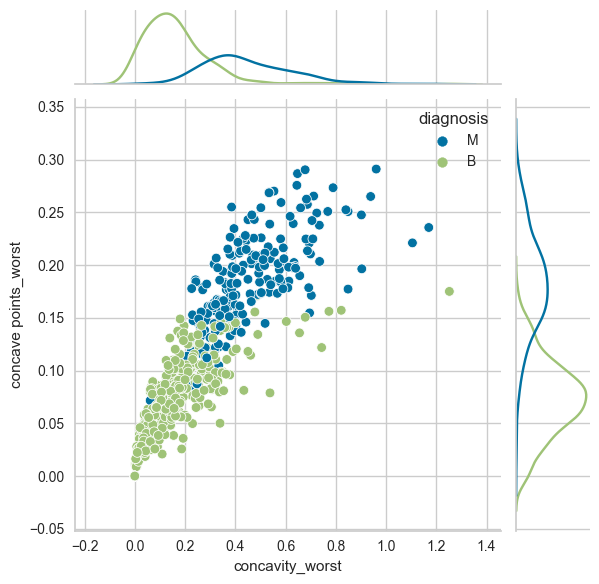

In [28]:
g = sns.JointGrid(data=data, x="concavity_worst", y="concave points_worst", hue="diagnosis")
g.plot(sns.scatterplot, sns.kdeplot)

## 1.12 PairGrid Plot Distribution Between `radius_worst`,`perimeter_worst`,`area_worst`<a class= 'anchor' id='1.12'></a>

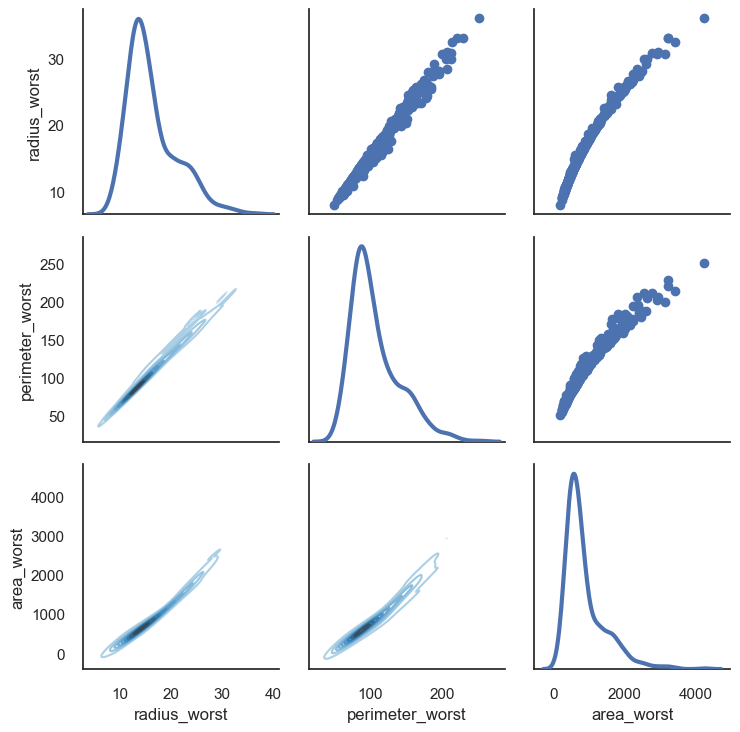

In [29]:
sns.set(style="white")
df = x.loc[:,['radius_worst','perimeter_worst','area_worst']]
g = sns.PairGrid(df, diag_sharey=False)
g.map_lower(sns.kdeplot, cmap="Blues_d")
g.map_upper(plt.scatter)
g.map_diag(sns.kdeplot, lw=3)

The code snippet you provided performs visualization using the seaborn library. Let's break it down step by step:

```python
sns.set(style="white")
```
This line sets the plot style to "white" for a clean and minimalistic look.

```python
df = x.loc[:,['radius_worst','perimeter_worst','area_worst']]
```
This line creates a new DataFrame `df` by selecting specific columns ('radius_worst', 'perimeter_worst', 'area_worst') from the DataFrame `x`.

```python
g = sns.PairGrid(df, diag_sharey=False)
```
Here, a PairGrid is created with the DataFrame `df`. A PairGrid is a grid of subplots that shows the pairwise relationships between variables in the DataFrame. The `diag_sharey=False` parameter ensures that the diagonal subplots do not share the y-axis.

```python
g.map_lower(sns.kdeplot, cmap="Blues_d")
```
This line maps a kernel density estimate (KDE) plot to the lower triangle of the PairGrid. It uses `sns.kdeplot` to visualize the distribution of data points. The `cmap="Blues_d"` parameter sets the color map for the KDE plot.

```python
g.map_upper(plt.scatter)
```
This line maps a scatter plot to the upper triangle of the PairGrid. It uses `plt.scatter` from matplotlib.pyplot to create the scatter plot.

```python
g.map_diag(sns.kdeplot, lw=3)
```
This line maps a KDE plot to the diagonal subplots of the PairGrid. It uses `sns.kdeplot` to visualize the distribution along the diagonal. The `lw=3` parameter sets the line width of the KDE plot.

Overall, this code generates a grid of subplots to visualize the pairwise relationships and distributions of the selected variables. The lower triangle shows KDE plots, the upper triangle shows scatter plots, and the diagonal contains KDE plots.

## 1.13 Corelation Plot Between Features<a class= 'anchor' id='1.13'></a>

<Axes: >

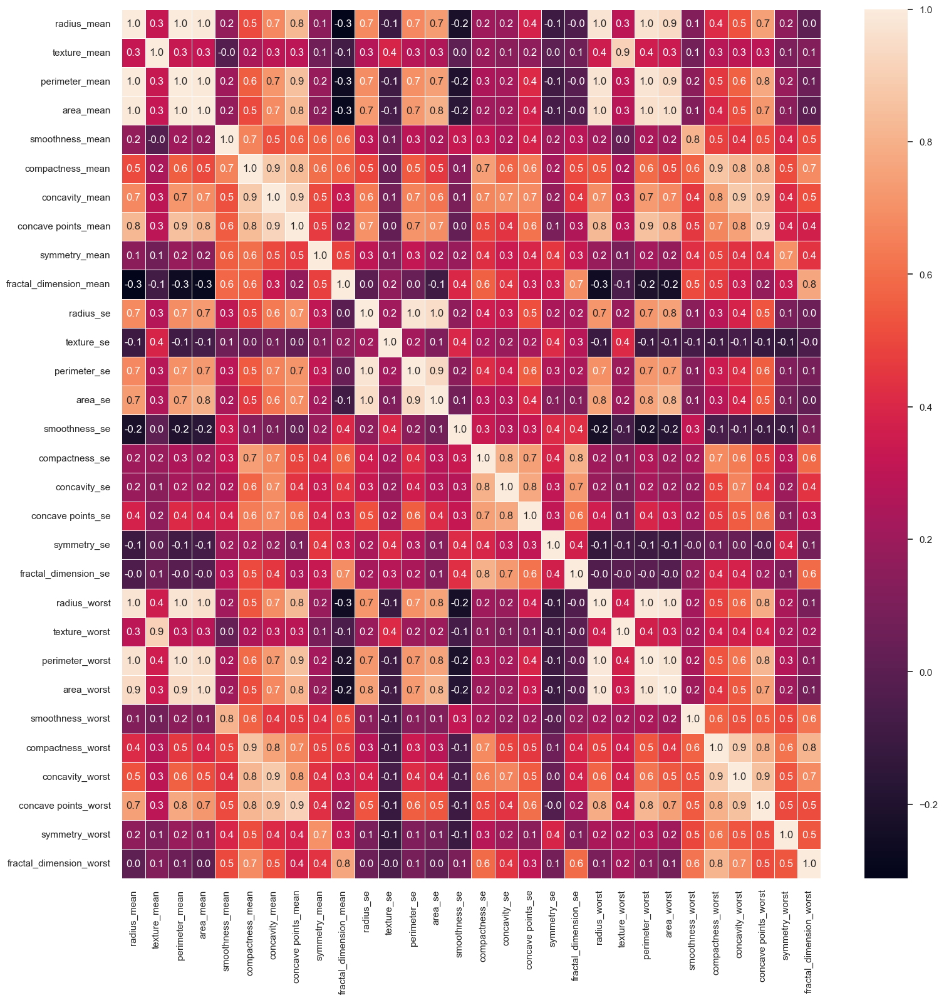

In [30]:
#correlation map
f,ax = plt.subplots(figsize=(18, 18))
sns.heatmap(x.corr(), annot=True, linewidths=.5, fmt= '.1f',ax=ax)

 this code generates a correlation heatmap, where each cell represents the correlation between two variables. The annotations provide the correlation values, allowing you to interpret the strength and direction of the relationships between variables.

# 2 Insight Generation from The Dataset<a class= 'anchor' id='2'></a>

## 2.1 Distribution of Benine and Malignenet Tumor With Available Data<a class= 'anchor' id='2.1'></a>

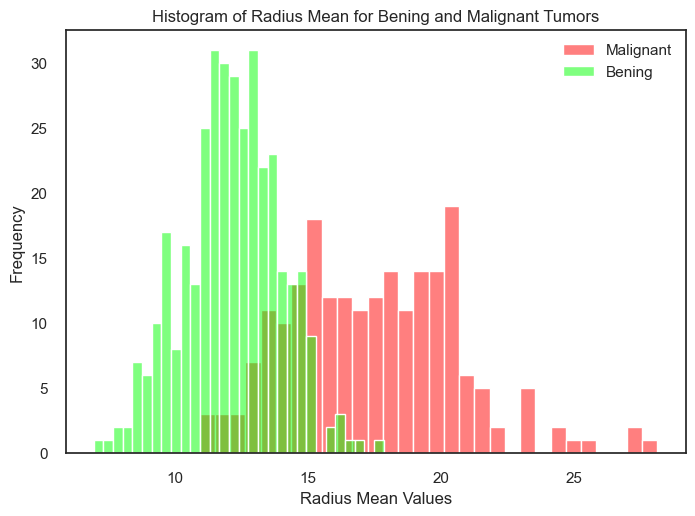

In [31]:
m = plt.hist(data[data["diagnosis"] == "M"].radius_mean,bins=30,fc = (1,0,0,0.5),label = "Malignant")
b = plt.hist(data[data["diagnosis"] == "B"].radius_mean,bins=30,fc = (0,1,0,0.5),label = "Bening")
plt.legend()
plt.xlabel("Radius Mean Values")
plt.ylabel("Frequency")
plt.title("Histogram of Radius Mean for Bening and Malignant Tumors")
plt.show()
frequent_malignant_radius_mean = m[0].max()
#index_frequent_malignant_radius_mean = list(m[0]).index(frequent_malignant_radius_mean)
#most_frequent_malignant_radius_mean = m[1][index_frequent_malignant_radius_mean]
#print("Most frequent malignant radius mean is: ",most_frequent_malignant_radius_mean)

## 2.2 Distribution of `radius_mean` of Benine and Malignenet Tumor With Available Data<a class= 'anchor' id='2.2'></a>

In [32]:
fig = px.histogram(data, x="radius_mean", color="diagnosis", marginal="box", # can be `rug`, `violin`
                         hover_data=data.columns)
fig.show()

### 2.2.1 Statistical Analysis of `radius_mean` of Benine and Malignenet Tumor With Available Data<a class= 'anchor' id='2.2.1'></a>

In [33]:
data_bening = data[data["diagnosis"] == "B"]
data_malignant = data[data["diagnosis"] == "M"]
desc = data_bening.radius_mean.describe()
Q1 = desc[4]
Q3 = desc[6]
IQR = Q3-Q1
lower_bound = Q1 - 1.5*IQR
upper_bound = Q3 + 1.5*IQR
print("Anything outside this range is an outlier: (", lower_bound ,",", upper_bound,")")
data_bening[data_bening.radius_mean < lower_bound].radius_mean
print("Outliers: ",data_bening[(data_bening.radius_mean < lower_bound) | (data_bening.radius_mean > upper_bound)].radius_mean.values)

Anything outside this range is an outlier: ( 7.645000000000001 , 16.805 )
Outliers:  [ 6.981 16.84  17.85 ]


### 2.2.2 Descriptive Statistical Analysis of `radius_mean` of Benine Tumor With Available Data<a class= 'anchor' id='2.2.2'></a>

In [34]:
print("mean: ",data_bening.radius_mean.mean())
print("variance: ",data_bening.radius_mean.var())
print("standart deviation (std): ",data_bening.radius_mean.std())
print("describe method: ",data_bening.radius_mean.describe())

mean:  12.146523809523808
variance:  3.1702217220438738
standart deviation (std):  1.7805116461410393
describe method:  count    357.000000
mean      12.146524
std        1.780512
min        6.981000
25%       11.080000
50%       12.200000
75%       13.370000
max       17.850000
Name: radius_mean, dtype: float64


### 2.2.3 CDF of bening tumor  `radius_mean` With Available Data<a class= 'anchor' id='2.2.2'></a>

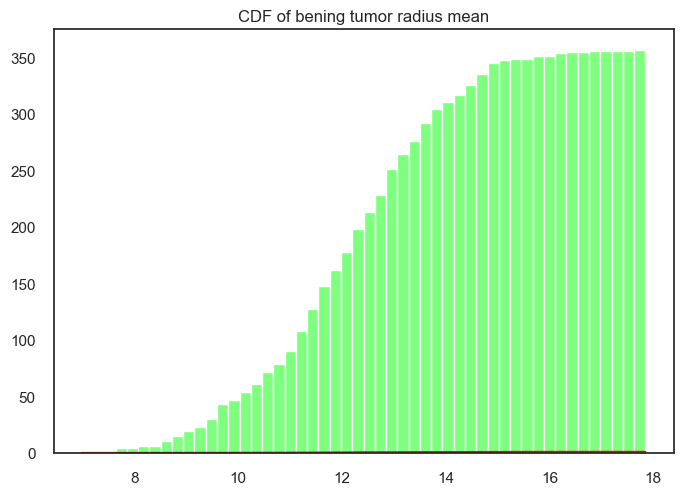

In [35]:
plt.hist(data_bening.radius_mean,bins=50,fc=(0,1,0,0.5),label='Bening',cumulative = True)
sorted_data = np.sort(data_bening.radius_mean)
y = np.arange(len(sorted_data))/float(len(sorted_data)-1)
plt.plot(sorted_data,y,color='red')
plt.title('CDF of bening tumor radius mean')
plt.show()

In [36]:
mean_diff = data_malignant.radius_mean.mean() - data_bening.radius_mean.mean()
var_bening = data_bening.radius_mean.var()
var_malignant = data_malignant.radius_mean.var()
var_pooled = (len(data_bening)*var_bening +len(data_malignant)*var_malignant ) / float(len(data_bening)+ len(data_malignant))
effect_size = mean_diff/np.sqrt(var_pooled)
print("Effect size: ",effect_size)

Effect size:  2.2048585165041414


In [37]:
# As I said above the data can be divided into three parts.lets divied the features according to their category
features_mean= (col[1:11])
features_se= (col[11:20])
features_worst=(col[21:31])
print(features_mean)
print("-----------------------------------")
print(features_se)
print("------------------------------------")
print(features_worst)

Index(['diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean',
       'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave points_mean', 'symmetry_mean'],
      dtype='object')
-----------------------------------
Index(['fractal_dimension_mean', 'radius_se', 'texture_se', 'perimeter_se',
       'area_se', 'smoothness_se', 'compactness_se', 'concavity_se',
       'concave points_se'],
      dtype='object')
------------------------------------
Index(['fractal_dimension_se', 'radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave points_worst',
       'symmetry_worst'],
      dtype='object')


In [38]:
features_mean.tolist()

['diagnosis',
 'radius_mean',
 'texture_mean',
 'perimeter_mean',
 'area_mean',
 'smoothness_mean',
 'compactness_mean',
 'concavity_mean',
 'concave points_mean',
 'symmetry_mean']

## 2.3 Corelation Plot Of Mean Features <a class= 'anchor' id='2.3'></a>

<Axes: >

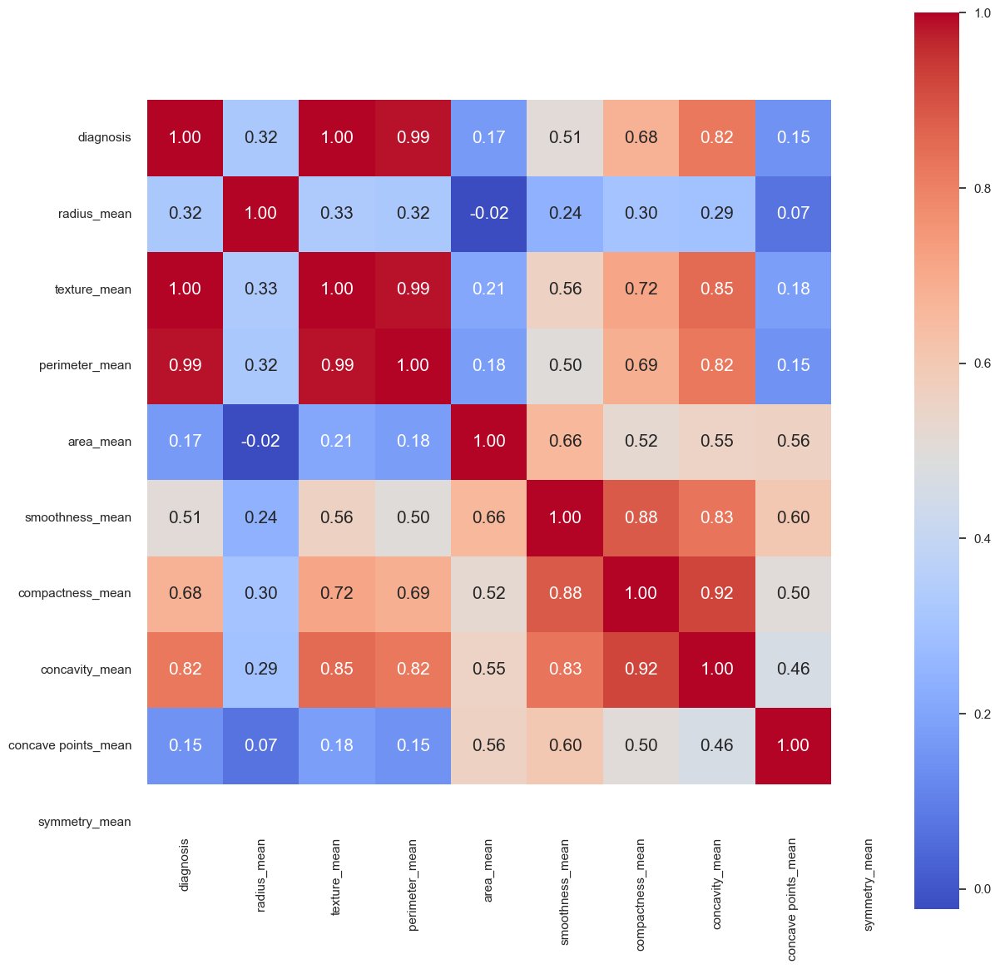

In [39]:
# now lets draw a correlation graph so that we can remove multi colinearity it means the columns are
# dependenig on each other so we should avoid it because what is the use of using same column twice
# lets check the correlation between features
# now we will do this analysis only for features_mean then we will do for others and will see who is doing best
corr = data[features_mean.tolist()[1:]].corr() # .corr is used for find corelation
plt.figure(figsize=(14,14))
sns.heatmap(corr, cbar = True,  square = True, annot=True, fmt= '.2f',annot_kws={'size': 15},
           xticklabels= features_mean, yticklabels= features_mean,
           cmap= 'coolwarm') # for more on heatmap you can visit Link(http://seaborn.pydata.org/generated/seaborn.heatmap.html)

In [40]:
corr_matrix = data[features_mean.tolist()[1:]].corr()
corr_matrix

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean
radius_mean,1.000000,0.323782,0.997855,0.987357,0.170581,0.506124,0.676764,0.822529,0.147741
texture_mean,0.323782,1.000000,0.329533,0.321086,-0.023389,0.236702,0.302418,0.293464,0.071401
perimeter_mean,0.997855,0.329533,1.000000,0.986507,0.207278,0.556936,0.716136,0.850977,0.183027
area_mean,0.987357,0.321086,0.986507,1.000000,0.177028,0.498502,0.685983,0.823269,0.151293
smoothness_mean,0.170581,-0.023389,0.207278,0.177028,1.000000,0.659123,0.521984,0.553695,0.557775
compactness_mean,0.506124,0.236702,0.556936,0.498502,0.659123,1.000000,0.883121,0.831135,0.602641
concavity_mean,0.676764,0.302418,0.716136,0.685983,0.521984,0.883121,1.000000,0.921391,0.500667
concave points_mean,0.822529,0.293464,0.850977,0.823269,0.553695,0.831135,0.921391,1.000000,0.462497
symmetry_mean,0.147741,0.071401,0.183027,0.151293,0.557775,0.602641,0.500667,0.462497,1.000000


## 2.4 Corelation Plot Of radius_mean and features with .75 Threshold <a class= 'anchor' id='2.4'></a>

Text(0.5, 1.0, 'Correlation Between Features with Corr Threshold 0.75 with radius mean ')

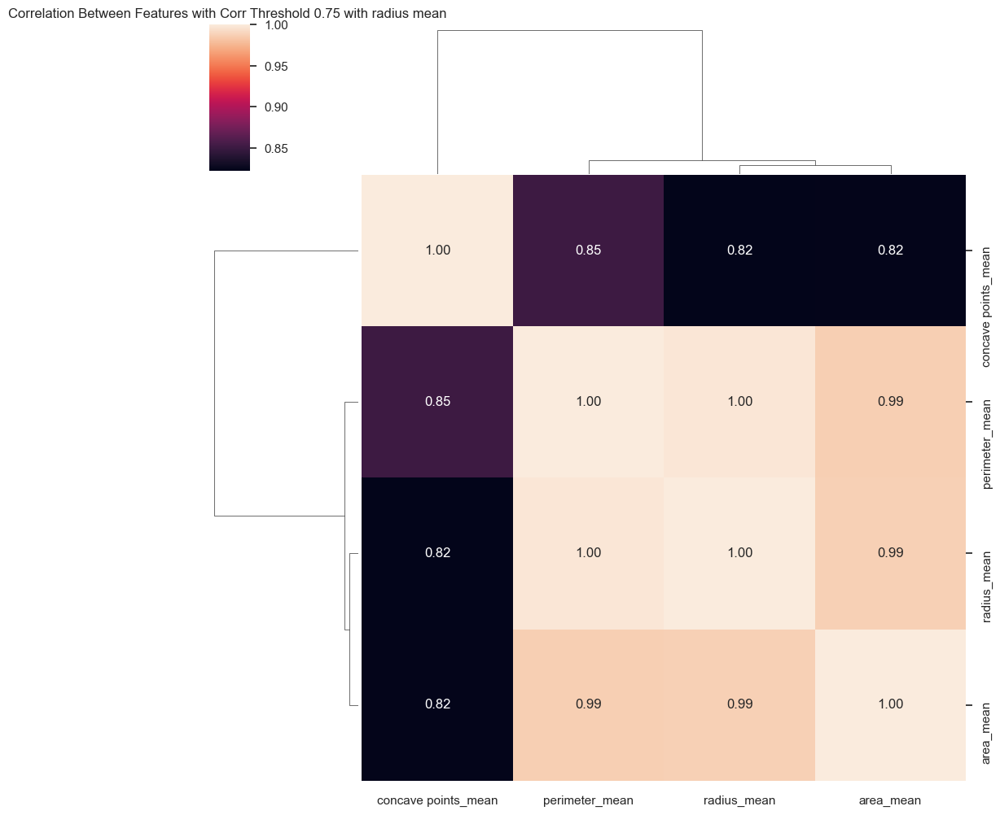

In [41]:
corr_matrix = data[features_mean.tolist()[1:]].corr()
threshold = 0.75
filtre = np.abs(corr_matrix["radius_mean"] > threshold)
corr_features = corr_matrix.columns[filtre].tolist()
sns.clustermap(data[corr_features].corr(), annot = True, fmt = ".2f")
plt.title("Correlation Between Features with Corr Threshold 0.75 with radius mean ")

## 2.5 Corelation Plot Of texture_mean and features with .25 Threshold <a class= 'anchor' id='2.5'></a>

Text(0.5, 1.0, 'Correlation Between Features with Corr Threshold 0.25 with feature mean ')

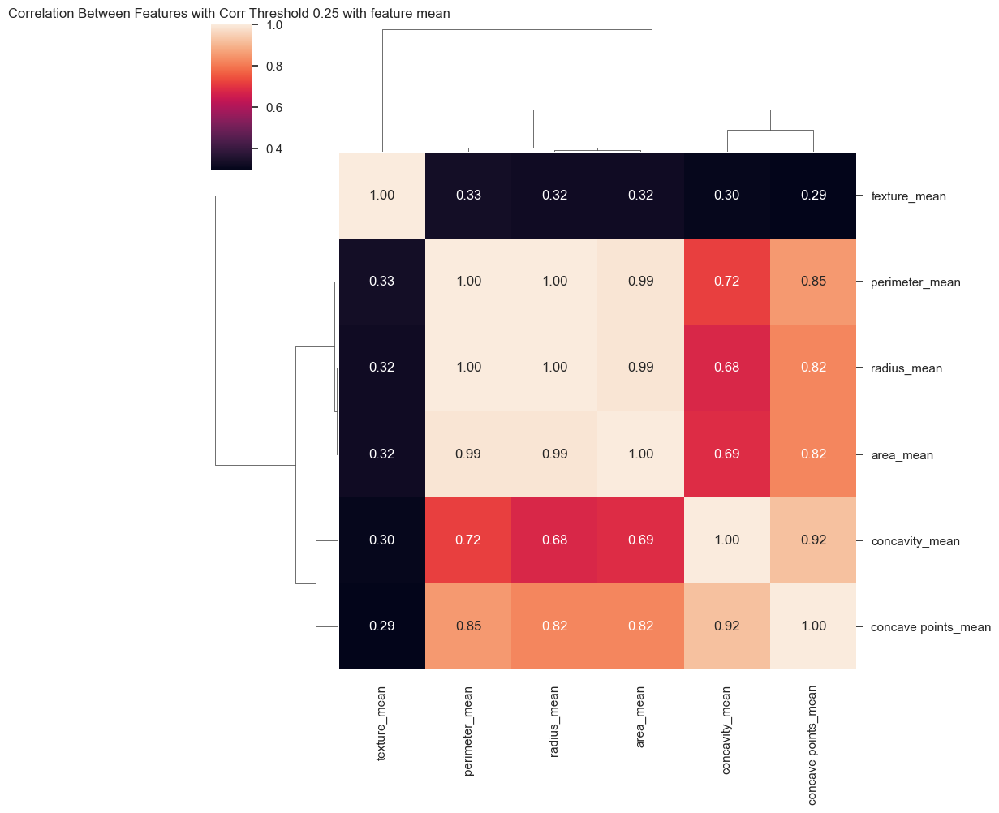

In [42]:
corr_matrix = data[features_mean.tolist()[1:]].corr()
threshold = 0.25
filtre = np.abs(corr_matrix["texture_mean"] > threshold)
corr_features = corr_matrix.columns[filtre].tolist()
sns.clustermap(data[corr_features].corr(), annot = True, fmt = ".2f")
plt.title("Correlation Between Features with Corr Threshold 0.25 with feature mean ")

## 2.6 Corelation Plot Of symmetry_mean and features with .5 Threshold <a class= 'anchor' id='2.6'></a>

Text(0.5, 1.0, 'Correlation Between Features with Corr Threshold 0.25 with feature mean ')

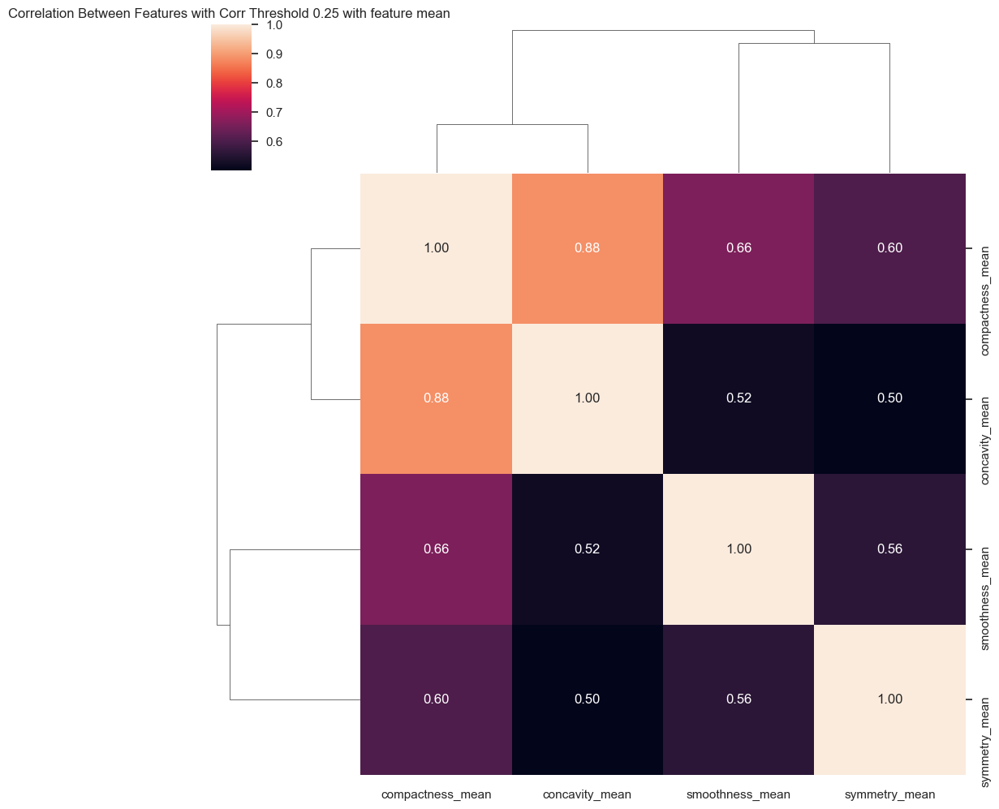

In [43]:
corr_matrix = data[features_mean.tolist()[1:]].corr()
threshold = 0.5
filtre = np.abs(corr_matrix["symmetry_mean"] > threshold)
corr_features = corr_matrix.columns[filtre].tolist()
sns.clustermap(data[corr_features].corr(), annot = True, fmt = ".2f")
plt.title("Correlation Between Features with Corr Threshold 0.25 with feature mean ")

# 3 Analysis Of Patient Data <a class= 'anchor' id='3'></a>

In [44]:
patient_data.head()

,Patient,ID,age,eventdeath,survival,timerecurrence,chemo,hormonal,amputation,histtype,diam,posnodes,grade,angioinv,lymphinfil,...,Contig55606_RC,D25217,NM_000846,NM_000849,Contig29022_RC,Contig36312_RC,Contig38980_RC,NM_000853,NM_000854,NM_000860,Contig29014_RC,Contig46616_RC,NM_000888,NM_000898,AF067420
0,s122,18,43,0,14.817248,14.817248,0,0,1,1,25,0,2,3,1,...,-0.301836,-0.271553,-0.383663,0.278246,-0.216583,0.591103,-0.355018,0.373644,-0.760690,-0.164025,-0.038726,0.237856,-0.087631,-0.369153,0.153795
1,s123,19,48,0,14.261465,14.261465,0,0,0,1,20,0,3,3,1,...,0.291171,-0.263896,-0.348006,-0.172679,0.224676,-0.199829,-0.001635,-0.062922,-0.682204,-0.220934,-0.100088,-0.466537,-0.231547,-0.643019,-0.014098
2,s124,20,38,0,6.644764,6.644764,0,0,0,1,15,0,2,1,1,...,0.355198,-0.363763,-0.364457,0.211452,0.519197,0.328736,-0.047571,0.084228,-0.695950,-0.402840,-0.099965,0.110155,-0.114298,0.258495,-0.198911
3,s125,21,50,0,7.748118,7.748118,0,1,0,1,15,1,2,3,1,...,-0.400131,-0.429229,-0.382146,0.189681,-0.115396,0.648861,-0.039088,0.182182,-0.524640,0.037320,-0.167688,-0.016790,-0.285344,-0.251188,0.862710
4,s126,22,38,0,6.436687,6.318960,0,0,1,1,15,0,2,2,1,...,-0.122634,-0.398354,-0.386030,0.286508,-0.238712,-0.287538,-0.286893,0.057082,-0.565021,-0.105632,-0.108148,-0.405853,-0.053601,-0.677072,0.134160


In [45]:
patient_list=patient_data.columns.tolist()

In [46]:
patient_list

['Patient',
 'ID',
 'age',
 'eventdeath',
 'survival',
 'timerecurrence',
 'chemo',
 'hormonal',
 'amputation',
 'histtype',
 'diam',
 'posnodes',
 'grade',
 'angioinv',
 'lymphinfil',
 'barcode',
 'esr1',
 'G3PDH_570',
 'Contig45645_RC',
 'Contig44916_RC',
 'D25272',
 'J00129',
 'Contig29982_RC',
 'Contig56678_RC',
 'Contig53047_RC',
 'Contig19551',
 'Contig47230_RC',
 'Contig46501_RC',
 'Contig20749_RC',
 'AL157500',
 'AL157502',
 'Contig37376_RC',
 'Contig45395_RC',
 'X98307',
 'AL157505',
 'AB033027',
 'Contig24026_RC',
 'Contig27800_RC',
 'Contig42500_RC',
 'Contig7147',
 'Contig32037_RC',
 'Contig16374_RC',
 'Contig42349_RC',
 'Contig33976_RC',
 'Contig49874_RC',
 'AB033060',
 'U45975',
 'M34428',
 'AB033083',
 'NM_003004',
 'Contig7192',
 'Contig23039_RC',
 'Contig22685_RC',
 'D84140',
 'Contig43806_RC',
 'NM_003022',
 'Contig54847_RC',
 'Contig33260_RC',
 'NM_002300',
 'Contig13929_RC',
 'NM_002318',
 'NM_003058',
 'Contig66143_RC',
 'Contig44519_RC',
 'NM_001609',
 'Contig1720

## 3.1 Visualization Of Patient Data with Important Features <a class= 'anchor' id='3.1'></a>

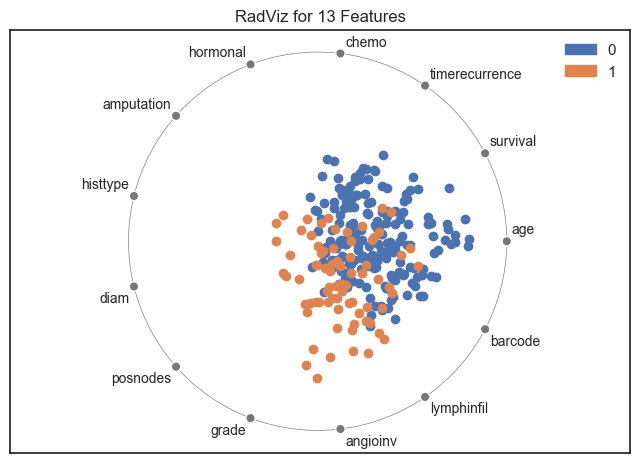

<Axes: title={'center': 'RadViz for 13 Features'}>

In [47]:
# visualise class separation

# data splitting

# subset data (without uninterpretable features)
features_to_drop = patient_data.columns[16:]
data_subset = patient_data.drop(features_to_drop, axis=1)
X = data_subset.drop(['Patient', 'ID', 'eventdeath'], axis=1)
y = data_subset['eventdeath']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)
from yellowbrick.features.rankd import Rank2D 
from yellowbrick.features.radviz import RadViz 
from yellowbrick.features.pcoords import ParallelCoordinates 

classes = ['alive', 'dead']
features = X.columns
visualizer = RadViz(clases=classes, features=features)

X_matrix = X.to_numpy()
y_matrix = y.to_numpy()

visualizer.fit(X_matrix, y_matrix)
visualizer.transform(X_matrix)
visualizer.poof()

In [48]:
data_subset.head()

,Patient,ID,age,eventdeath,survival,timerecurrence,chemo,hormonal,amputation,histtype,diam,posnodes,grade,angioinv,lymphinfil,barcode
0,s122,18,43,0,14.817248,14.817248,0,0,1,1,25,0,2,3,1,6274
1,s123,19,48,0,14.261465,14.261465,0,0,0,1,20,0,3,3,1,6275
2,s124,20,38,0,6.644764,6.644764,0,0,0,1,15,0,2,1,1,6276
3,s125,21,50,0,7.748118,7.748118,0,1,0,1,15,1,2,3,1,6277
4,s126,22,38,0,6.436687,6.318960,0,0,1,1,15,0,2,2,1,6278


In [49]:
data_subset[data_subset["eventdeath"]==1]

,Patient,ID,age,eventdeath,survival,timerecurrence,chemo,hormonal,amputation,histtype,diam,posnodes,grade,angioinv,lymphinfil,barcode
9,s131,27,39,1,4.662560,1.114305,0,0,0,1,17,0,3,1,1,6283
12,s134,30,38,1,7.093771,6.995209,1,0,0,1,12,1,3,1,1,6286
14,s136,32,31,1,3.822040,3.438741,0,0,1,1,40,2,3,1,1,6288
16,s138,34,44,1,3.849418,3.474333,0,0,1,1,15,0,3,1,1,6290
19,s141,37,33,1,2.064339,1.401780,0,0,1,1,30,0,3,1,3,6293
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
267,s71,308,48,1,2.608300,1.982204,1,0,1,1,30,0,3,1,3,4321
268,s72,309,39,1,5.504100,3.028063,0,0,1,1,30,0,2,1,1,4322
269,s73,310,50,1,2.619200,2.149213,0,0,1,1,27,0,3,1,1,4323
270,s75,311,52,1,2.290500,2.209446,0,1,1,1,28,0,3,1,1,4325


## 3.2 Visualization Of End Result of Patient data<a class= 'anchor' id='3.2'></a>

<Axes: xlabel='eventdeath', ylabel='count'>

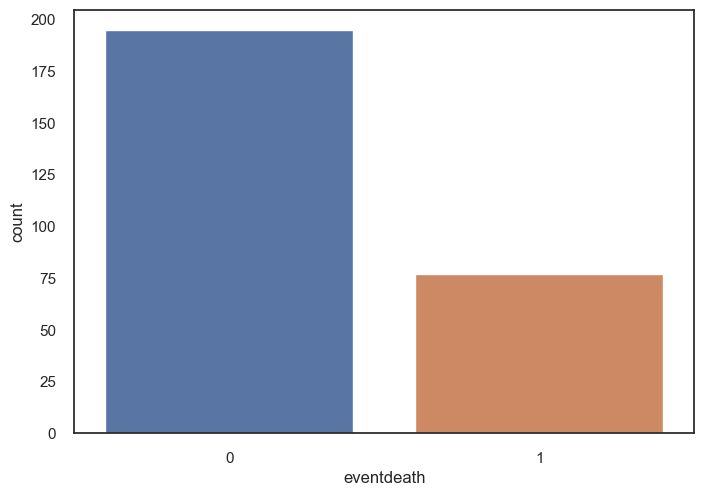

In [50]:
sns.countplot(x=data_subset["eventdeath"])

## 3.3 Visualization Of Grade VS Eventdeath Analysis <a class= 'anchor' id='3.3'></a>

<Axes: xlabel='grade', ylabel='count'>

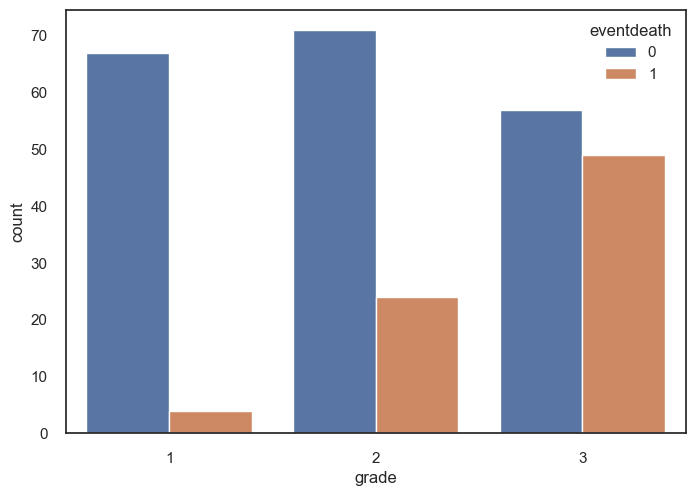

In [51]:
sns.countplot(data=data_subset, x="grade", hue="eventdeath")

## 3.4 Visualization Of Grade VS Chemo Analysis <a class= 'anchor' id='3.4'></a>

<Axes: xlabel='grade', ylabel='count'>

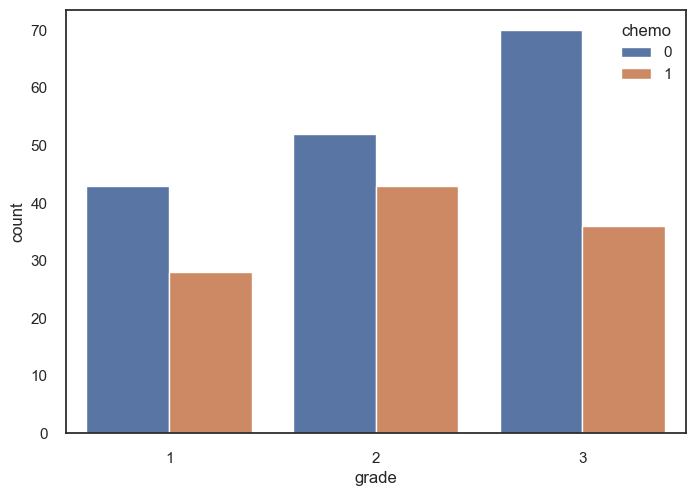

In [52]:
sns.countplot(data=data_subset, x="grade", hue="chemo")

## 3.5 Visualization Of Chemo VS Eventdeath Analysis <a class= 'anchor' id='3.5'></a>

<Axes: xlabel='eventdeath', ylabel='count'>

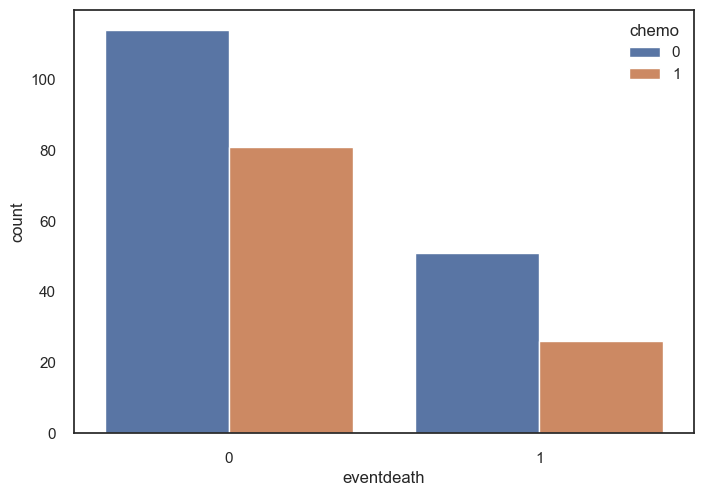

In [53]:
sns.countplot(data=data_subset, x="eventdeath", hue="chemo")

## 3.6 Visualization Of grade VS Eventdeath Analysis <a class= 'anchor' id='3.6'></a>

<Axes: xlabel='eventdeath', ylabel='count'>

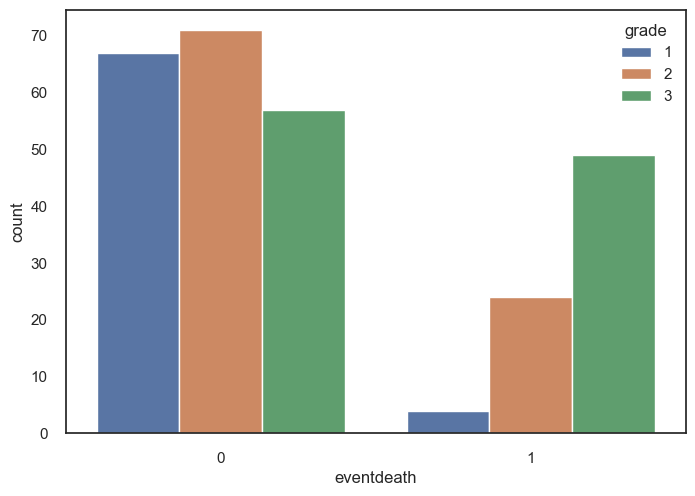

In [54]:
sns.countplot(data=data_subset, x="eventdeath", hue="grade")

## 3.7 Counter Plot Of age,survival and diameter <a class= 'anchor' id='3.7'></a>

In [55]:
fig = go.Figure(data =
     go.Contour(x = data_subset.age, y = data_subset.survival,z=data_subset.diam,
               colorscale='rainbow'
               ))
 
fig.show()

## 3.8 Mesh Plot Of age,survival and diameter <a class= 'anchor' id='3.8'></a>

In [56]:
fig = go.Figure(data=[go.Mesh3d(
  x = data_subset.age, y = data_subset.survival,z=data_subset.diam, color='green', opacity=0.20)])
  
fig.show()

## 3.9 Joint Plot Of age and survival <a class= 'anchor' id='3.9'></a>

<Figure size 1500x1000 with 0 Axes>

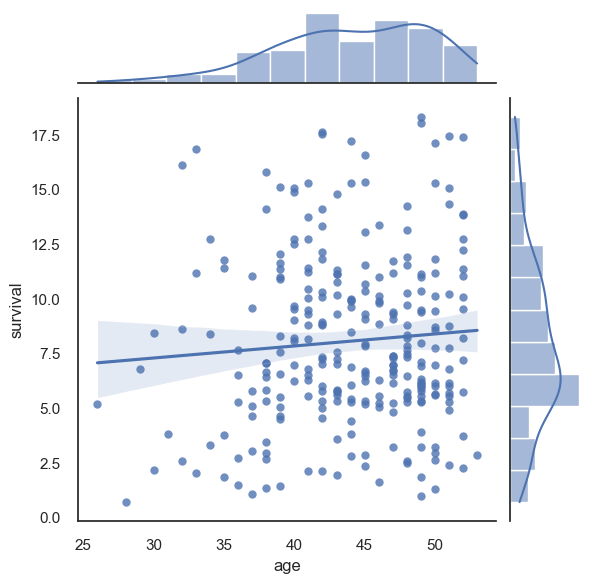

In [57]:
plt.figure(figsize = (15,10))
sns.jointplot(data=data_subset,x='age',y='survival',kind="reg")
plt.show()

## 3.10 Joint Plot Of diam and survival <a class= 'anchor' id='3.10'></a>

<Figure size 1500x1000 with 0 Axes>

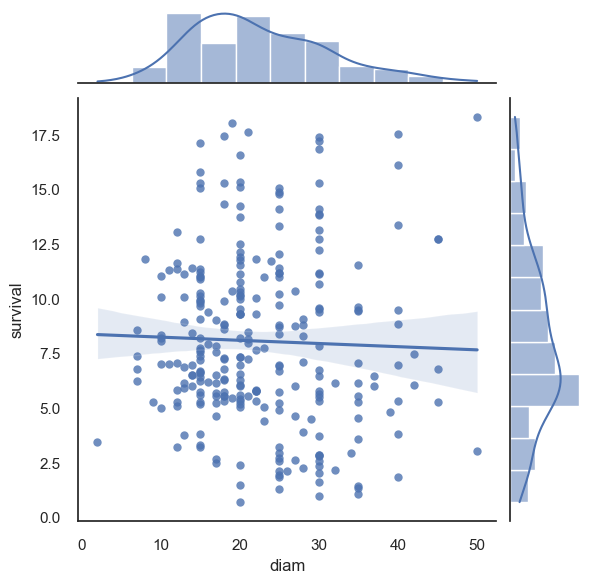

In [58]:
plt.figure(figsize = (15,10))
sns.jointplot(data=data_subset,x='diam',y='survival',kind="reg")
plt.show()

## 3.11 Joint Plot Of diam and survival with counters <a class= 'anchor' id='3.11'></a>

<Figure size 1500x1000 with 0 Axes>

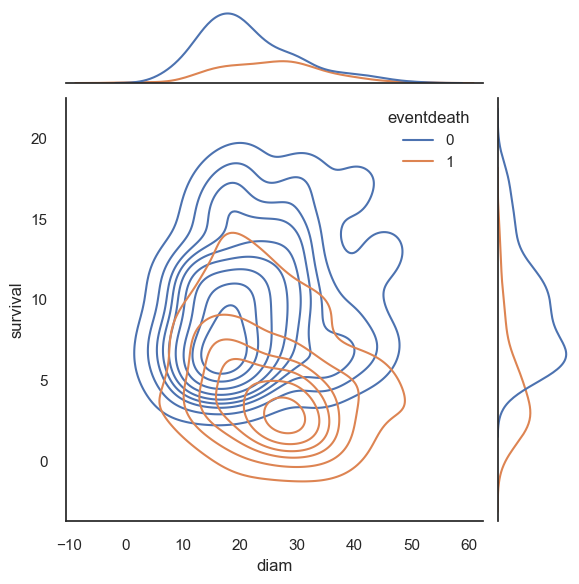

In [59]:
plt.figure(figsize = (15,10))
sns.jointplot(data=data_subset,x='diam',y='survival',kind="kde",hue='eventdeath')
plt.show()

## 3.12 Joint Plot Of age and survival with counters <a class= 'anchor' id='3.12'></a>

<Figure size 1500x1000 with 0 Axes>

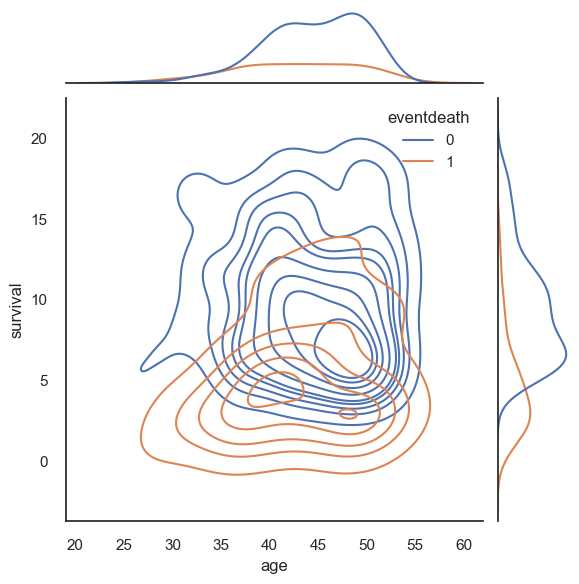

In [60]:
plt.figure(figsize = (15,10))
sns.jointplot(data=data_subset,x='age',y='survival',kind="kde",hue='eventdeath')
plt.show()

## 3.13 Joint Plot Of age and survival with scatters <a class= 'anchor' id='3.13'></a>

<Figure size 1500x1000 with 0 Axes>

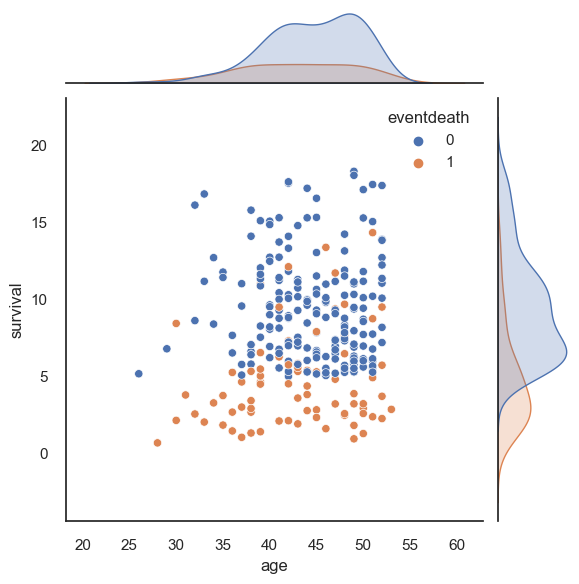

In [61]:
plt.figure(figsize = (15,10))
sns.jointplot(data=data_subset,x='age',y='survival',kind="scatter",hue='eventdeath')
plt.show()

## 3.14 Joint Plot Of diam and survival with scatters <a class= 'anchor' id='3.14'></a>

<Figure size 1500x1000 with 0 Axes>

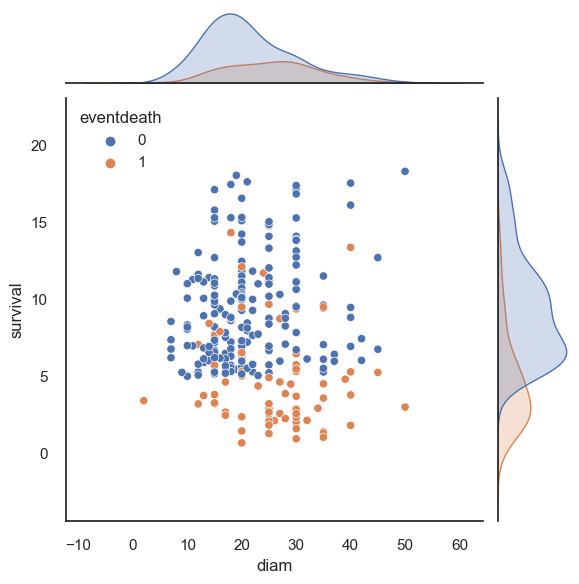

In [62]:
plt.figure(figsize = (15,10))
sns.jointplot(data=data_subset,x='diam',y='survival',kind="scatter",hue='eventdeath')
plt.show()

## 3.15 HeatMap Of Age and survival with scatters <a class= 'anchor' id='3.15'></a>

In [63]:
fig = px.density_heatmap(data_subset, x="age", y="survival", marginal_x="histogram", marginal_y="histogram")
fig.show()

## 3.16 Hisogram Of Age Of Patients <a class= 'anchor' id='3.16'></a>

In [64]:
fig = px.histogram(data_subset, x="age")
fig.show()

## 3.17 Hisogram Of Age Of Patients With Target <a class= 'anchor' id='3.17'></a>

In [65]:
fig = px.histogram(data_subset, x="age",color="eventdeath")
fig.show()

## 3.18 Hisogram Of Age And Grade <a class= 'anchor' id='3.18'></a>

In [66]:
fig = px.histogram(data_subset, x="age",color="grade")
fig.show()

## 3.19 Hisogram Of Age And Death <a class= 'anchor' id='3.19'></a>

<Axes: xlabel='age', ylabel='Count'>

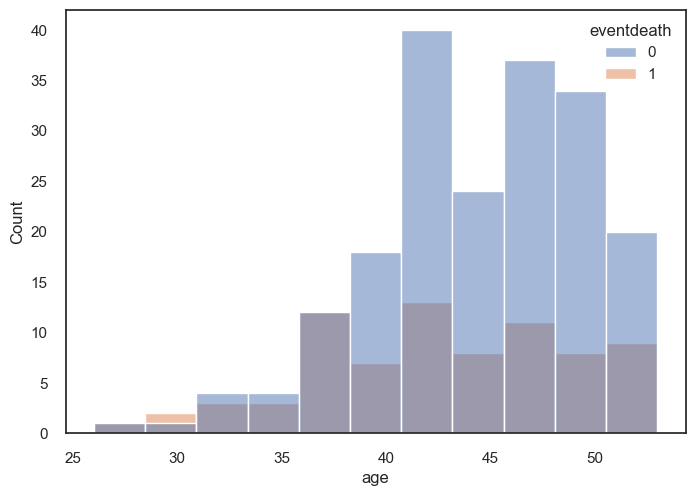

In [67]:
sns.histplot(data=data_subset, x="age", hue="eventdeath")

## 3.20 Hisogram Of Age And Grade <a class= 'anchor' id='3.20'></a>

<Axes: xlabel='age', ylabel='Count'>

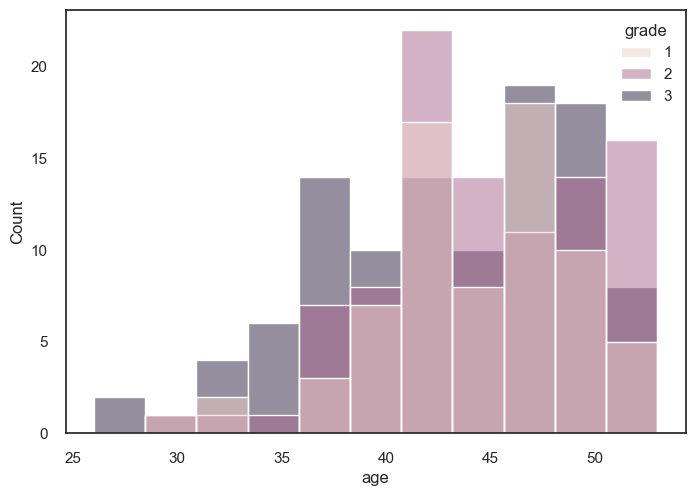

In [68]:
sns.histplot(data=data_subset, x="age", hue="grade")

## 3.21 Hisogram Of Survival And Grade <a class= 'anchor' id='3.21'></a>

<Axes: xlabel='survival', ylabel='Count'>

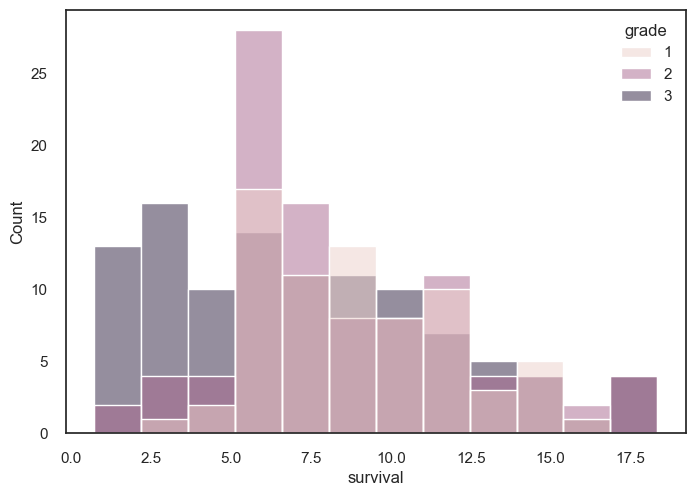

In [69]:
sns.histplot(data=data_subset, x="survival", hue="grade")

## 3.22 Hisogram Of Different Features and Analysis <a class= 'anchor' id='3.22'></a>

<Axes: xlabel='survival', ylabel='Count'>

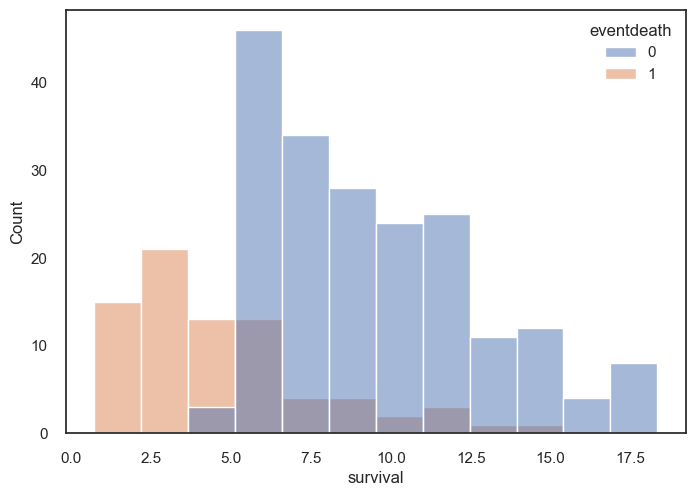

In [70]:
sns.histplot(data=data_subset, x="survival", hue="eventdeath")

<Axes: xlabel='eventdeath', ylabel='count'>

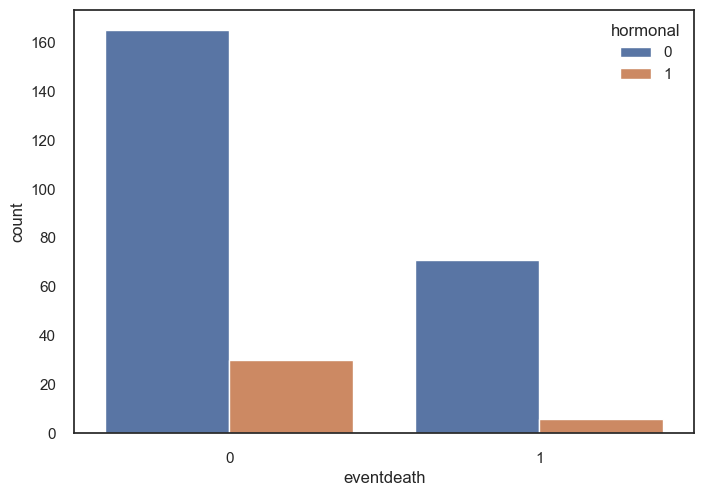

In [71]:
sns.countplot(data=data_subset, x="eventdeath", hue="hormonal")

<Axes: xlabel='eventdeath', ylabel='count'>

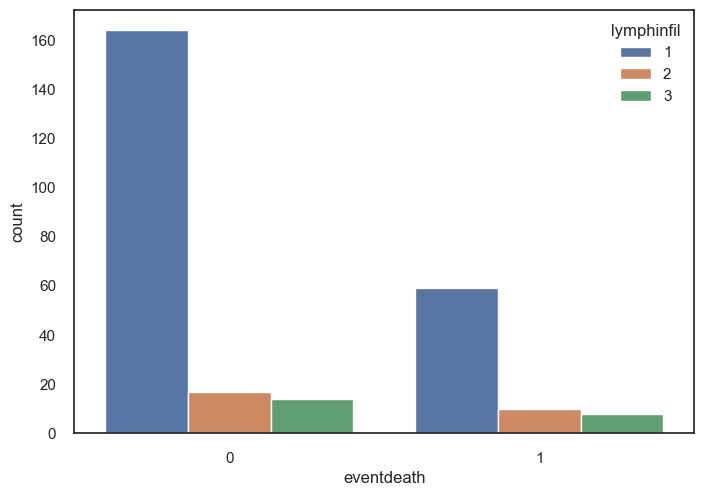

In [72]:
sns.countplot(data=data_subset, x="eventdeath", hue="lymphinfil")

<Axes: xlabel='eventdeath', ylabel='count'>

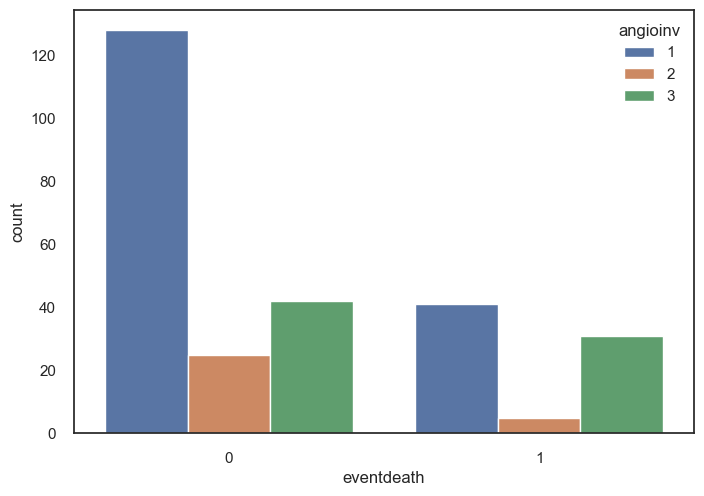

In [73]:
sns.countplot(data=data_subset, x="eventdeath", hue="angioinv")

<Axes: xlabel='eventdeath', ylabel='count'>

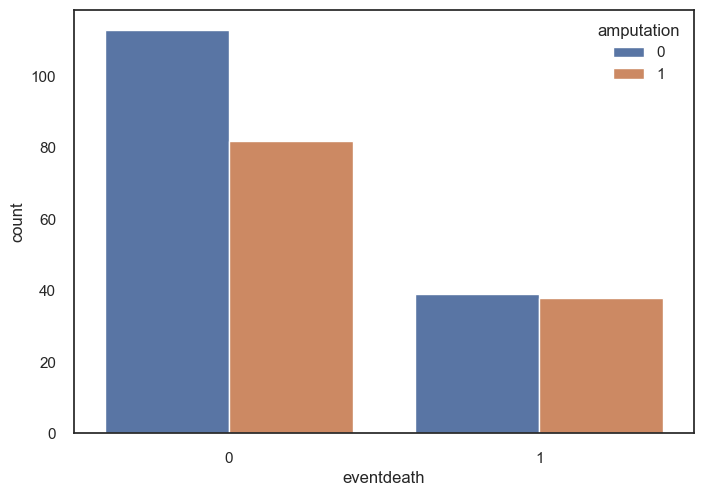

In [74]:
sns.countplot(data=data_subset, x="eventdeath", hue="amputation")

<Axes: xlabel='age', ylabel='diam'>

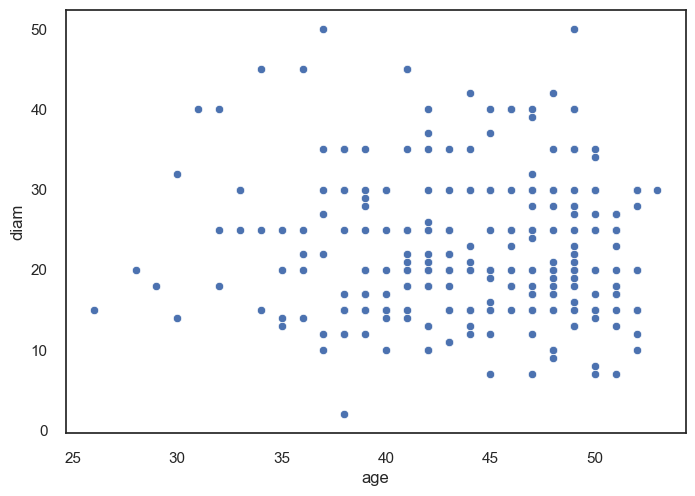

In [75]:
sns.scatterplot(data_subset,x='age',y='diam')

<Axes: xlabel='age', ylabel='survival'>

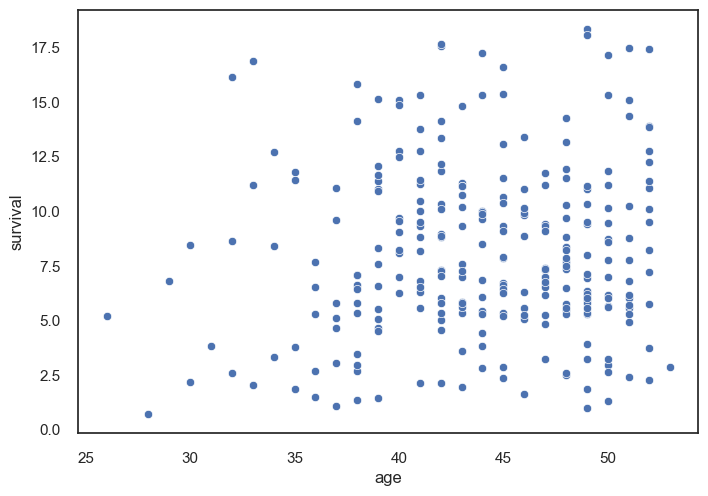

In [76]:
sns.scatterplot(data_subset,x='age',y='survival')

<Axes: xlabel='diam', ylabel='survival'>

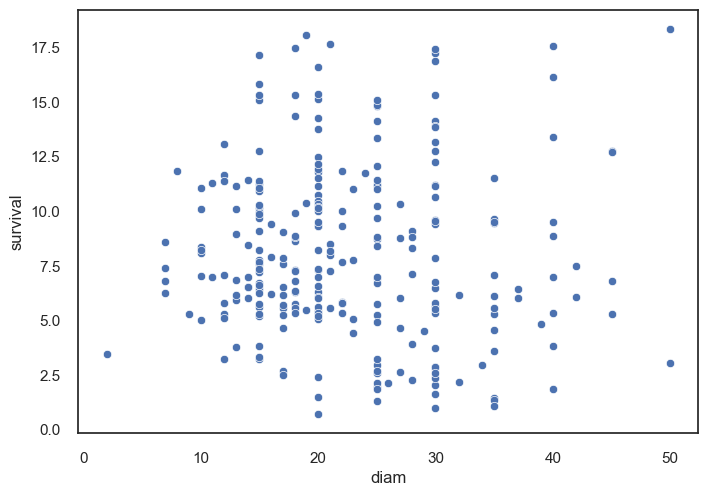

In [77]:
sns.scatterplot(data_subset,x='diam',y='survival')

# 4. Outlier Detection <a class= 'anchor' id='4'></a>

In [78]:
x = data.drop(["diagnosis"], axis = 1)
y = data.diagnosis
columns = x.columns.tolist()

In [79]:

clf = LocalOutlierFactor()
y_pred = clf.fit_predict(x)

In [80]:
y_pred[:20]

array([-1, -1,  1,  1,  1, -1, -1,  1, -1,  1, -1,  1, -1, -1,  1,  1,  1,
        1,  1,  1])

In [81]:
X_score = clf.negative_outlier_factor_

In [82]:
outlier_score = pd.DataFrame()
outlier_score["score"] = X_score
outlier_score

,score
0,-2.183163
1,-2.154486
2,-1.268009
3,-1.260062
4,-1.258933
...,...
564,-1.151149
565,-1.148759
566,-1.145338
567,-1.236382


The code snippet uses the Local Outlier Factor (LOF) algorithm to detect outliers in the dataset `x`. The algorithm assigns an anomaly score to each data point, where lower scores indicate a higher likelihood of being an outlier. The outlier scores are stored in a DataFrame called `outlier_score`. The DataFrame provides an overview of the anomaly scores assigned to each data point, allowing for further analysis or identification of potential outliers. This approach can be useful in outlier detection and anomaly detection tasks, providing insights into data points that deviate significantly from the majority of the dataset.

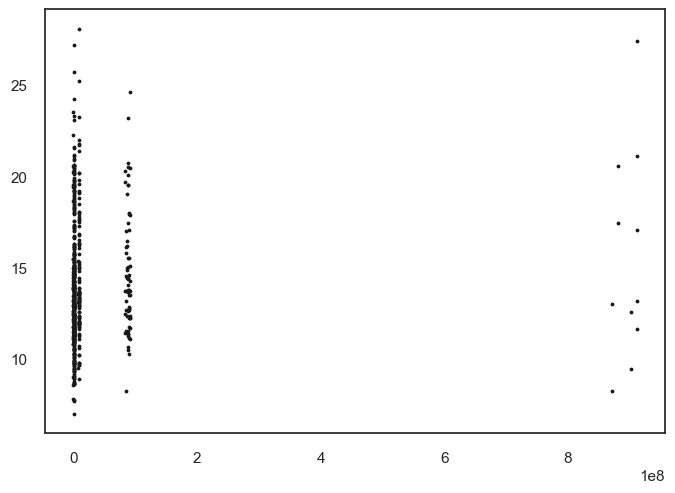

In [83]:
plt.figure()
plt.scatter(x.iloc[:,0], x.iloc[:,1], color = "k", s = 3, label = "Data Point")

In [84]:
radius = (X_score.max() - X_score)/(X_score.max() - X_score.min())
outlier_score["radius"] = radius
outlier_score

,score,radius
0,-2.183163,0.004118
1,-2.154486,0.004024
2,-1.268009,0.001097
3,-1.260062,0.001071
4,-1.258933,0.001067
...,...,...
564,-1.151149,0.000711
565,-1.148759,0.000704
566,-1.145338,0.000692
567,-1.236382,0.000993


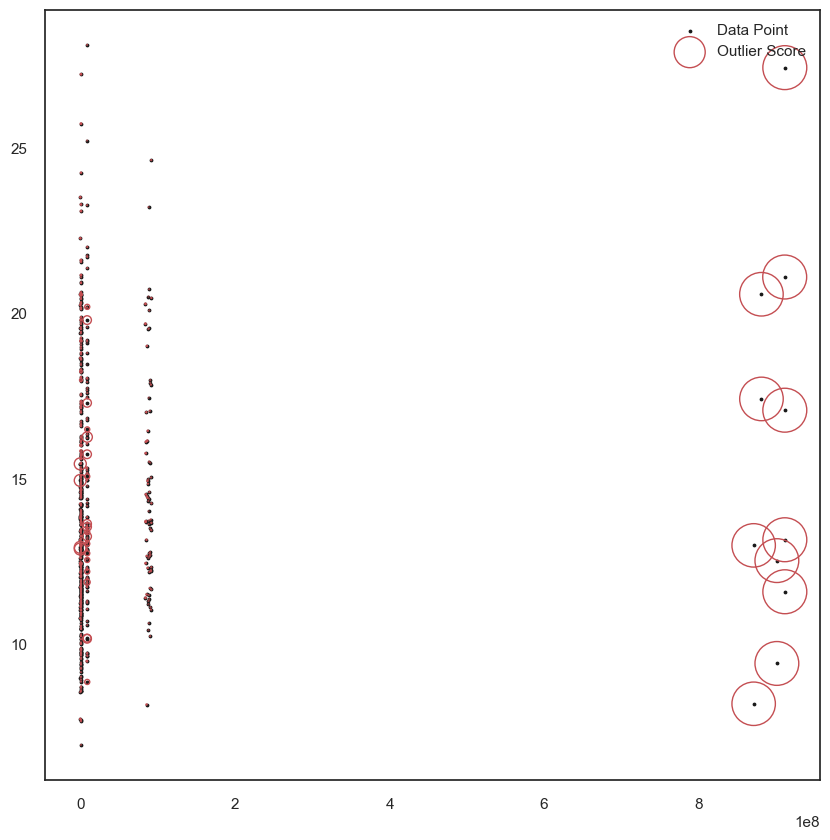

In [85]:
plt.figure(figsize = (10,10))
plt.scatter(x.iloc[:,0], x.iloc[:,1], color = "k", s = 3, label = "Data Point")
plt.scatter(x.iloc[:,0], x.iloc[:,1], s = 1000*radius, edgecolors = "r", facecolors = "none", label = "Outlier Score")
plt.legend()

The code snippet generates a scatter plot of the data points in the dataset `x`. Each data point is represented by a black dot. Additionally, the code overlays the outlier scores on the scatter plot by varying the size of the data points based on the calculated radius. Larger radius values indicate higher outlier scores. The outliers are visually highlighted as larger data points with red outlines and no fill. The plot provides a visual representation of the outlier scores and their spatial distribution within the dataset. This can aid in identifying and understanding the presence of outliers in the data.

In [86]:
threshold_outlier = -2.5
filtre = outlier_score["score"] < threshold_outlier
outlier_index = outlier_score[filtre].index.tolist()

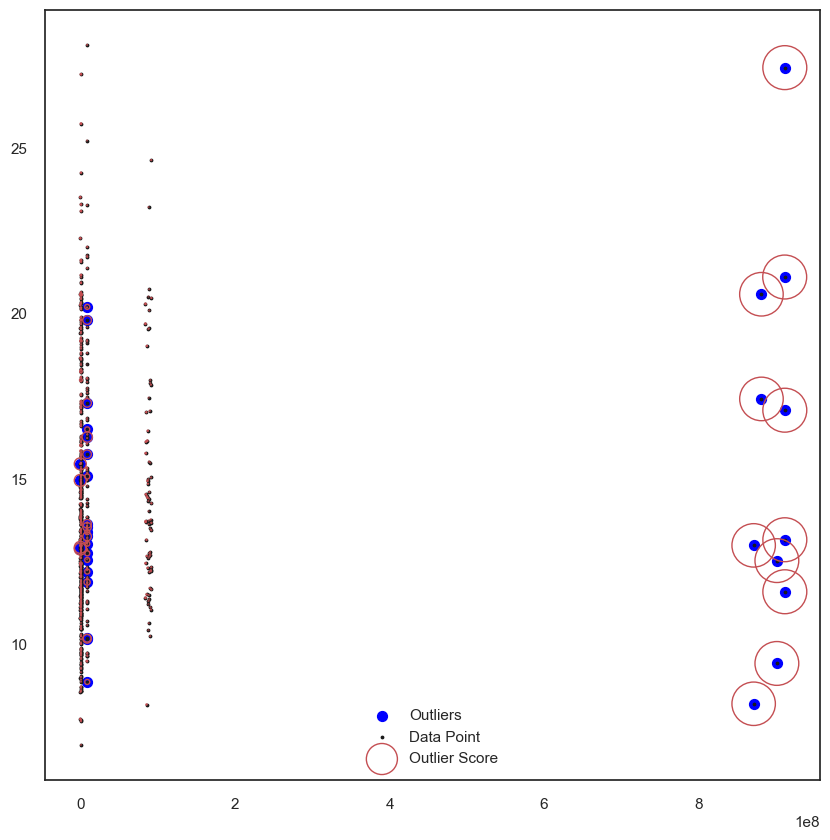

In [87]:
plt.figure(figsize = (10,10))
plt.scatter(x.iloc[outlier_index,0], x.iloc[outlier_index,1], color = "blue", s = 50, label = "Outliers")
plt.scatter(x.iloc[:,0], x.iloc[:,1], color = "k", s = 3, label = "Data Point")
plt.scatter(x.iloc[:,0], x.iloc[:,1], s = 1000*radius, edgecolors = "r", facecolors = "none", label = "Outlier Score")
plt.legend()

The code snippet generates a scatter plot of the data points in the dataset `x`. It specifically highlights the outliers by plotting them as blue points, while the non-outliers are represented by black dots. The outlier scores are also visualized by varying the size of the data points based on the calculated radius, with larger radius values indicating higher outlier scores. The plot provides a clear distinction between the outliers and the rest of the data points, allowing for easy identification and analysis of the outliers.

# 5. Machine Learning Section <a class= 'anchor' id='5'></a>

## 5.1 Test-Train Split and Scaling of Training Data <a class= 'anchor' id='5.1'></a>

In [88]:
x_train, x_test, y_train, y_test = train_test_split(x,y, test_size = 0.3, random_state = 42)

print("x_train shape: ", x_train.shape)
print("x_test shape: ", x_test.shape)
print("y_train shape: ", y_train.shape)
print("y_test shape: ", y_test.shape)

x_train shape:  (398, 31)
x_test shape:  (171, 31)
y_train shape:  (398,)
y_test shape:  (171,)


this code splits the data into training and testing sets, allowing us to separate our data for model training and evaluation purposes.

In [89]:

scaler = StandardScaler()
X_train = scaler.fit_transform(x_train)
X_test = scaler.transform(x_test)

Overall, this code snippet performs feature scaling using the StandardScaler to standardize the training and testing data.

In [90]:
X_train_df = pd.DataFrame(X_train, columns = columns)
X_train_df["diagnosis"] = y_train
X_train_df

,id,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,perimeter_se,area_se,...,concavity_se,concave points_se,symmetry_se,fractal_dimension_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,diagnosis
0,-0.230559,-0.123490,-0.296801,-0.170507,-0.208616,-1.201680,-0.773170,-0.762312,-0.933241,-1.229949,-0.948166,-0.533593,-0.860288,-0.616781,-0.391775,...,-0.481703,-0.979400,-0.884593,-0.685487,-0.197620,-0.506748,-0.307910,-0.273576,-1.507424,-0.449260,-0.572239,-0.840822,-0.856362,-0.765748,NaN
1,-0.230595,-0.228268,-0.657951,-0.253775,-0.296503,-1.804637,-0.587616,-0.091985,-0.542684,-1.419985,-0.612491,-0.830401,-0.122667,-0.782544,-0.531261,...,0.576685,-0.248287,-1.035724,0.107689,-0.422917,-0.458495,-0.465287,-0.438127,-1.273017,0.027042,0.318045,-0.377067,-1.341582,-0.414807,M
2,-0.230271,0.145534,-1.230564,0.245833,-0.010242,0.519184,1.570006,0.732320,0.386583,1.054201,1.574228,0.487478,0.592589,0.909184,0.181325,...,0.683623,0.622238,0.769101,0.624386,0.036022,-1.192272,0.203869,-0.127445,-0.024877,0.770802,0.272612,-0.047627,-0.089971,0.488264,NaN
3,-0.230513,-0.358532,-0.672207,-0.400937,-0.400014,-1.203862,-0.970650,-0.634704,-0.654992,0.096572,-0.827986,-0.725949,-0.568787,-0.654670,-0.508935,...,-0.301474,-0.563090,-0.230110,-0.619011,-0.502189,-0.583287,-0.501000,-0.493386,-0.959895,-0.663496,-0.470142,-0.493515,0.226547,-0.802899,M
4,-0.230144,-0.157472,0.967224,-0.208843,-0.241538,-0.254695,-0.700630,-0.750349,-0.637469,-0.518248,-0.642882,-0.202659,0.255204,-0.383292,-0.191661,...,-0.401416,-0.459655,0.062159,-0.456221,-0.195534,0.596414,-0.296107,-0.266734,-0.442374,-0.656085,-0.835138,-0.659802,-0.387208,-0.800613,M
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
393,-0.230640,-1.497494,-1.073749,-1.379543,-1.160029,0.135881,0.973654,-0.025866,-0.523567,0.368583,3.748516,0.418534,-0.677521,0.138624,-0.310460,...,0.814547,0.920979,0.629211,6.851190,-1.367290,-1.636531,-1.355982,-1.048088,-0.481514,-0.036959,-0.638602,-1.034066,-1.010604,1.421056,NaN
394,-0.230614,-0.718174,-0.197010,-0.704330,-0.689902,1.326521,-0.031346,-0.223452,-0.360813,-0.007761,0.350328,-0.340548,0.874065,-0.341141,-0.409185,...,-0.093594,0.329921,-0.589826,0.018551,-0.656559,0.624700,-0.661404,-0.631799,1.610316,0.113949,0.095984,0.124773,-0.123711,0.424820,NaN
395,-0.167184,0.032261,-0.555784,-0.080644,-0.075809,-2.303586,-1.496809,-1.039653,-1.120156,-1.099533,-1.229967,-0.946572,-0.932777,-0.962089,-0.610938,...,-0.913920,-1.335962,-0.626047,-0.910220,-0.287322,-0.807912,-0.391138,-0.346027,-2.004940,-1.338808,-1.173282,-1.261790,-0.682839,-1.276726,NaN
396,-0.230256,-0.055526,0.109492,-0.046842,-0.168160,0.730110,0.195463,0.315536,0.429860,-0.499617,0.383481,-0.634253,-0.482609,-0.603046,-0.445439,...,-0.346781,-0.378866,-1.016989,-0.356886,0.157015,0.880940,0.197816,-0.022013,1.284147,0.725664,0.706523,1.079240,0.475584,1.255302,NaN


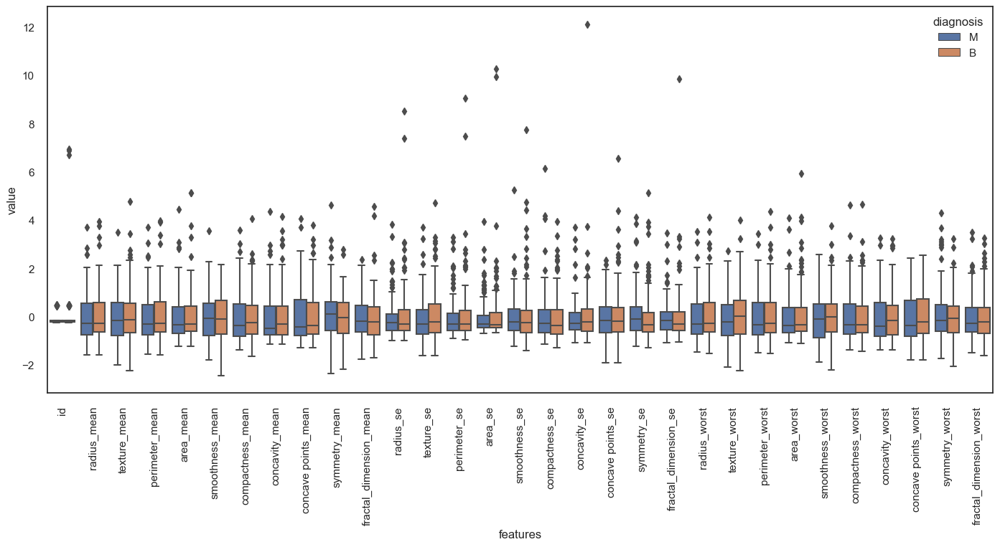

In [91]:
# Box Plot
X_train_melt = pd.melt(X_train_df, id_vars = "diagnosis",
                   var_name = "features",
                   value_name = "value")

plt.figure(figsize = (17,7))
sns.boxplot(x = "features", y = "value", hue = "diagnosis", data = X_train_melt)
plt.xticks(rotation = 90)
plt.show()

Overall, this code generates a box plot that displays the distribution of feature values for different categories of the "diagnosis" variable in the training data. The box plot allows for visual comparison of the distribution, central tendency, and spread of the features among the different diagnosis categories.

In [92]:
X_train_df.columns

Index(['id', 'radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean',
       'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean',
       'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se',
       'fractal_dimension_se', 'radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave points_worst',
       'symmetry_worst', 'fractal_dimension_worst', 'diagnosis'],
      dtype='object')

In [93]:
corr_features = ['radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave points_worst',
       'symmetry_worst', 'fractal_dimension_worst', 'diagnosis']

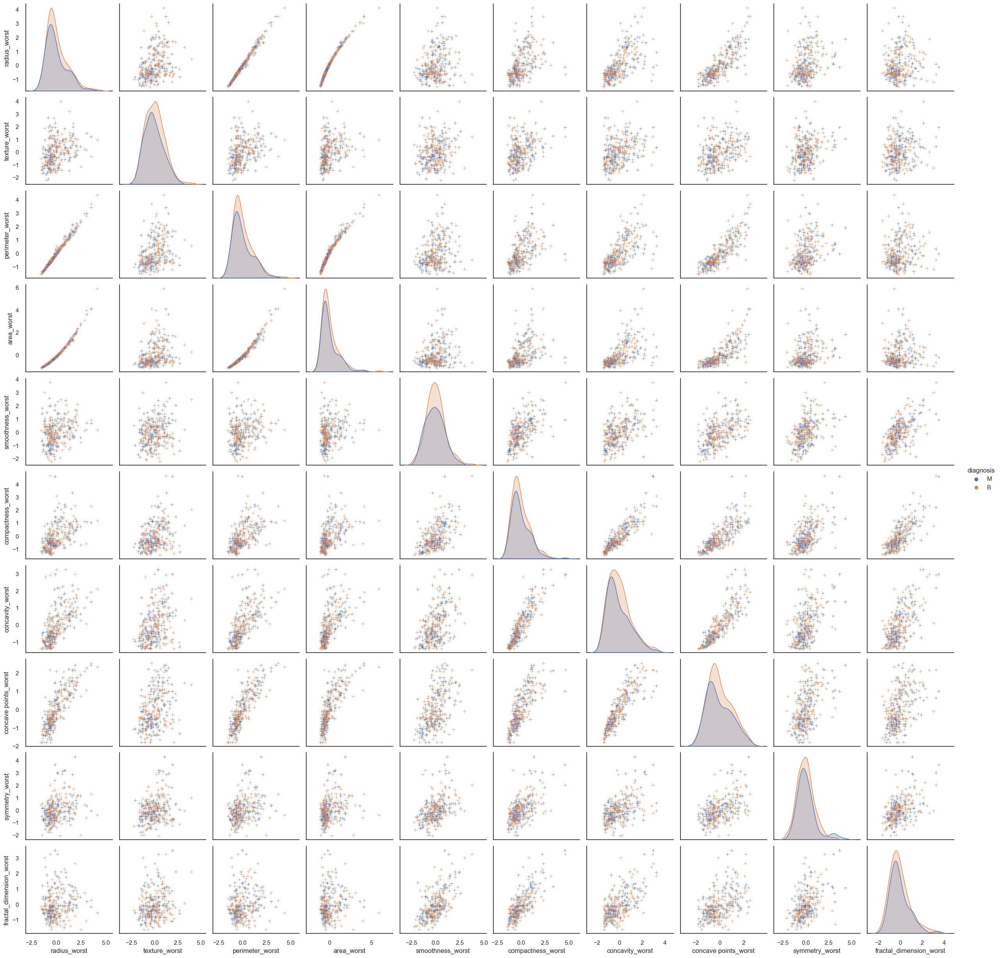

In [94]:
# Pair plot
sns.pairplot(X_train_df[corr_features], diag_kind = "kde", markers = "+", hue = "diagnosis")
plt.show()

## 5.2 KNN Model and Its Performence <a class= 'anchor' id='5.2'></a>

 this code generates a pair plot that provides a visual representation of the pairwise relationships between selected features in the X_train_df DataFrame. The diagonal subplots show the distribution of individual features using KDE plots, while the off-diagonal subplots show scatter plots illustrating the relationships between pairs of features. The hue parameter adds color differentiation based on the "diagnosis" category.

In [95]:
# Created Model
knn = KNeighborsClassifier(n_neighbors=2)

# Fit
knn.fit(X_train,y_train)

# Predict
y_pred_knn = knn.predict(X_test)

# Confusion Matrix
cm = confusion_matrix(y_test, y_pred_knn)

# Accuracy Score
acc = accuracy_score(y_test, y_pred_knn)

# Score
score = knn.score(X_test, y_test)

print("Score: ", score)
print("CM: ", cm)
print("Basic Knn Acc: ", acc)

Score:  0.9532163742690059
CM:  [[107   1]
 [  7  56]]
Basic Knn Acc:  0.9532163742690059


It demonstrates the creation and evaluation of a KNN classifier model, including training, prediction, and evaluation steps.We can see the accuracy score is quite high 95%.

In [96]:
def KNN_Best_Params(x_train, x_test, y_train, y_test):
    # n_neighbors
    k_range = [i for i in range(1, 31)]
    # weights
    weigh_options = ["uniform", "distance"]
    # P
    p = [1,2]
    param_grid = dict(n_neighbors = k_range, weights = weigh_options , p = p)
    
    # Created KNN model
    knn = KNeighborsClassifier()
    
    # Created Grid model
    grid = GridSearchCV(knn, param_grid, cv = 10, scoring = "accuracy")
    
    # Fit grid
    grid.fit(x_train, y_train)
    
    print("Best training score: {} with parameters: {}".format(grid.best_score_, grid.best_params_))
    
    # Created KNN model
    knn = KNeighborsClassifier(**grid.best_params_)
    
    # Fit Knn
    knn.fit(x_train, y_train)
    
    # Predict
    y_pred_test = knn.predict(x_test)
    y_pred_train = knn.predict(x_train)
    
    # Confusion Matrix
    cm_test = confusion_matrix(y_test, y_pred_test)
    cm_train =confusion_matrix(y_train, y_pred_train)
    
    # Accuracy Score
    acc_test = accuracy_score(y_test, y_pred_test)
    acc_train = accuracy_score(y_train, y_pred_train)
    
    print("Test Score: {}, Train Score: {}".format(acc_test, acc_train))
    print("CM Test: ",cm_test)
    print("CM Train: ",cm_train)
    
    return grid

In [97]:
grid = KNN_Best_Params(X_train, X_test, y_train, y_test)

Best training score: 0.9648076923076923 with parameters: {'n_neighbors': 8, 'p': 2, 'weights': 'distance'}
Test Score: 0.9590643274853801, Train Score: 1.0
CM Test:  [[105   3]
 [  4  59]]
CM Train:  [[249   0]
 [  0 149]]


This code tries to find best parameters to predict the output more accuractly. 

### 5.2.1 KNN Model's Performence Matrix <a class= 'anchor' id='5.2.1'></a>

Accuracy is:  0.9532163742690059


<Axes: >

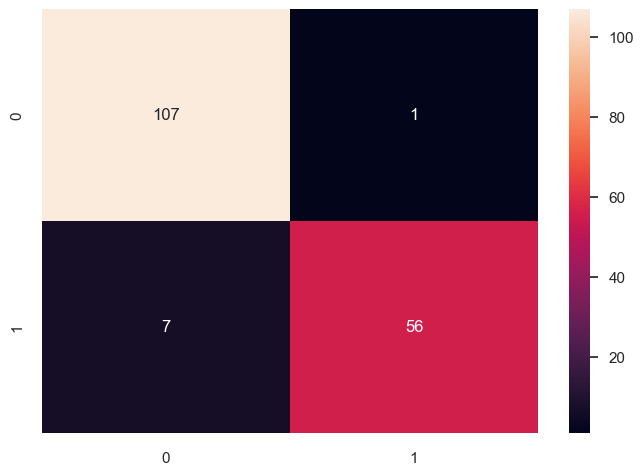

In [98]:
ac = accuracy_score(y_test,y_pred_knn)
print('Accuracy is: ',ac)
cm = confusion_matrix(y_test,y_pred_knn)
sns.heatmap(cm,annot=True,fmt="d")

In [99]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
# find best scored 5 features
select_feature = SelectKBest(chi2, k=5).fit(x_train, y_train)

this code snippet performs feature selection using the chi-square test and selects the top 5 features that are most strongly related to the target variable.

In [100]:
print('Score list:', select_feature.scores_)
print('Feature list:', x_train.columns)

Score list: [1.32358390e+08 1.77946492e+02 6.06916433e+01 1.34061092e+03
 3.66899557e+04 1.00015175e-01 3.41839493e+00 1.30547650e+01
 7.09766457e+00 1.95982847e-01 3.42575072e-04 2.45882967e+01
 4.07131026e-02 1.72696840e+02 6.12741067e+03 1.32470372e-03
 3.74071521e-01 6.92896719e-01 2.01587194e-01 1.39557806e-03
 2.65927071e-03 3.25782599e+02 1.16958562e+02 2.40512835e+03
 7.50217341e+04 2.63226314e-01 1.19077581e+01 2.58858117e+01
 8.90751003e+00 1.00635138e+00 1.23087347e-01]
Feature list: Index(['id', 'radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean',
       'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean',
       'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se',
       'fractal_dimension_se', 'radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'c

### 5.2.2 KNN Model's Best  Performence Matrix <a class= 'anchor' id='5.2.2'></a>

Accuracy is:  0.9590643274853801


<Axes: >

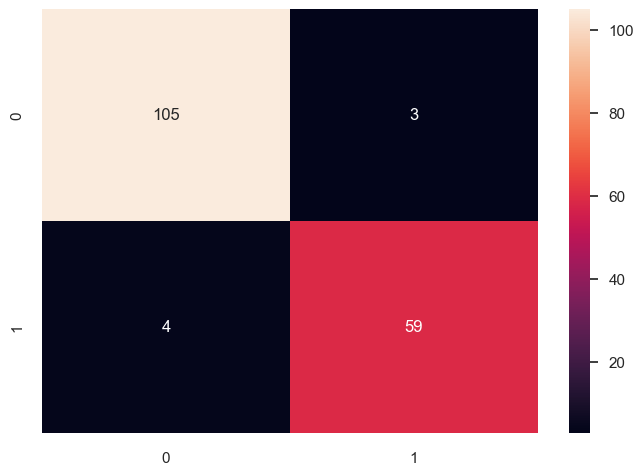

In [101]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import f1_score,confusion_matrix
from sklearn.metrics import accuracy_score
x_train_2 = select_feature.transform(x_train)
x_test_2 = select_feature.transform(x_test)
#random forest classifier with n_estimators=10 (default)
clf_rf_2 = RandomForestClassifier()      
clr_rf_2 = clf_rf_2.fit(x_train_2,y_train)
ac_2 = accuracy_score(y_test,clf_rf_2.predict(x_test_2))
print('Accuracy is: ',ac_2)
cm_2 = confusion_matrix(y_test,clf_rf_2.predict(x_test_2))
sns.heatmap(cm_2,annot=True,fmt="d")

### 5.2.3 Optimal Feature Selection <a class= 'anchor' id='5.2.3'></a>

In [102]:
from sklearn.feature_selection import RFECV

# The "accuracy" scoring is proportional to the number of correct classifications
clf_rf_4 = RandomForestClassifier() 
rfecv = RFECV(estimator=clf_rf_4, step=1, cv=5,scoring='accuracy')   #5-fold cross-validation
rfecv = rfecv.fit(x_train, y_train)

print('Optimal number of features :', rfecv.n_features_)
print('Best features :', x_train.columns[rfecv.support_])

Optimal number of features : 9
Best features : Index(['perimeter_mean', 'concavity_mean', 'concave points_mean',
       'radius_worst', 'texture_worst', 'perimeter_worst', 'area_worst',
       'concavity_worst', 'concave points_worst'],
      dtype='object')


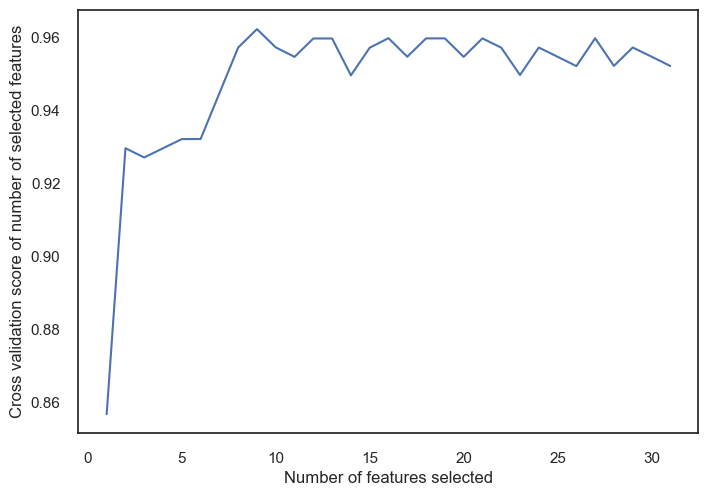

In [103]:
# Plot number of features VS. cross-validation scores
import matplotlib.pyplot as plt
plt.figure()
plt.xlabel("Number of features selected")
plt.ylabel("Cross validation score of number of selected features")
plt.plot(range(1, len(rfecv.cv_results_['mean_test_score']) + 1), rfecv.cv_results_['mean_test_score'])
plt.show()

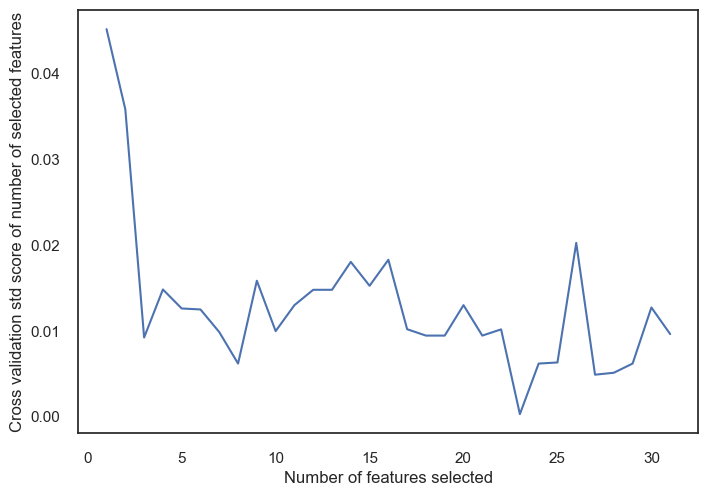

In [104]:
# Plot number of features VS. cross-validation scores
import matplotlib.pyplot as plt
plt.figure()
plt.xlabel("Number of features selected")
plt.ylabel("Cross validation std score of number of selected features")
plt.plot(range(1, len(rfecv.cv_results_['std_test_score']) + 1), rfecv.cv_results_['std_test_score'])
plt.show()

The code snippet uses RFECV (Recursive Feature Elimination with Cross-Validation) with a Random Forest Classifier to select the optimal number of features. It prints the optimal number of features and displays the names of the best features selected. Two plots show the relationship between the number of selected features and the cross-validation scores, as well as the standard deviation of the test scores.

### 5.2.4 Feature Importance plot for RandomForest Model <a class= 'anchor' id='5.2.4'></a>

Feature ranking:
1. feature 8 (0.128755)
2. feature 23 (0.123402)
3. feature 24 (0.115049)
4. feature 28 (0.106351)
5. feature 21 (0.080424)
6. feature 7 (0.073753)
7. feature 4 (0.053190)
8. feature 27 (0.037170)
9. feature 3 (0.033629)
10. feature 14 (0.027355)
11. feature 1 (0.027014)
12. feature 22 (0.022339)
13. feature 26 (0.019796)
14. feature 2 (0.017420)
15. feature 6 (0.014911)
16. feature 13 (0.014346)
17. feature 11 (0.014003)
18. feature 29 (0.011317)
19. feature 17 (0.010946)
20. feature 25 (0.009050)
21. feature 5 (0.009021)
22. feature 15 (0.007367)
23. feature 30 (0.006573)
24. feature 10 (0.006002)
25. feature 0 (0.005242)
26. feature 9 (0.004824)
27. feature 16 (0.004802)
28. feature 12 (0.004750)
29. feature 19 (0.004502)
30. feature 20 (0.003510)
31. feature 18 (0.003189)


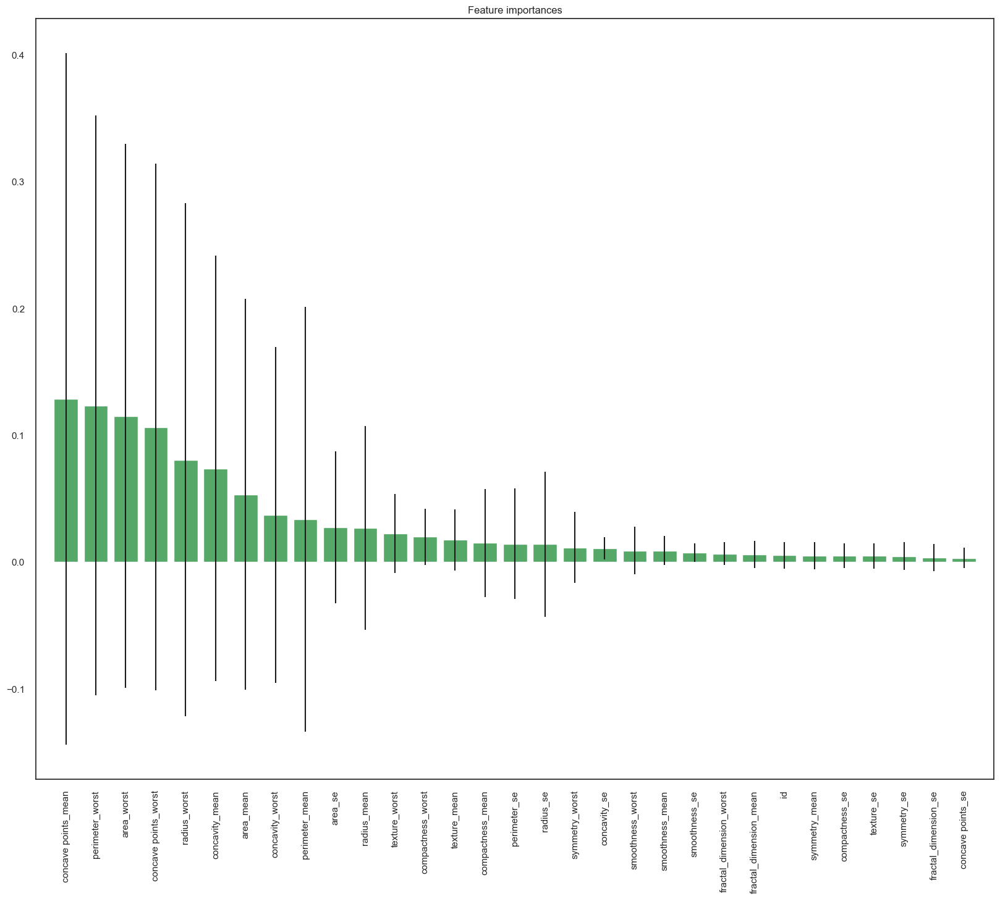

In [105]:
#random forest classifier with n_estimators=10 (default)
clf_rf = RandomForestClassifier(random_state=43)      
clr_rf = clf_rf.fit(x_train,y_train)
clf_rf_5 = RandomForestClassifier()      
clr_rf_5 = clf_rf_5.fit(x_train,y_train)
importances = clr_rf_5.feature_importances_
std = np.std([tree.feature_importances_ for tree in clf_rf.estimators_],
             axis=0)
indices = np.argsort(importances)[::-1]

# Print the feature ranking
print("Feature ranking:")

for f in range(x_train.shape[1]):
    print("%d. feature %d (%f)" % (f + 1, indices[f], importances[indices[f]]))

# Plot the feature importances of the forest

plt.figure(1, figsize=(20,16))
plt.title("Feature importances")
plt.bar(range(x_train.shape[1]), importances[indices],
       color="g", yerr=std[indices], align="center")
plt.xticks(range(x_train.shape[1]), x_train.columns[indices],rotation=90)
plt.xlim([-1, x_train.shape[1]])
plt.show()

The code snippet provided trains a Random Forest Classifier model and examines the feature importances. The Random Forest model is trained using the `x_train` and `y_train` datasets. The feature importances are calculated, ranked, and printed. Finally, a bar plot is created to visualize the feature importances.

The feature importances represent the relative importance of each feature in the prediction task. Higher importance values indicate that a feature has a stronger influence on the model's predictions. By examining the feature importances, you can gain insights into which features are most informative for the classification task.

The bar plot visualizes the feature importances, where each bar represents a feature. The height of the bar corresponds to the feature importance, allowing for a quick visual comparison of the importance levels among different features. The x-axis displays the feature names, and the bars are color-coded in green. Error bars are also included, representing the standard deviation of the feature importances across the trees in the Random Forest model.

By analyzing the feature importances and their rankings, you can identify the most significant features that contribute to the model's predictions. This information can help in feature selection, understanding the underlying relationships in the data, and potentially improving the model's performance.

In [106]:
scaler = StandardScaler()
x_scaled = scaler.fit_transform(x)

## 5.3 Dimension Reduction Using T-SNE <a class= 'anchor' id='5.3'></a>

In [107]:
from sklearn.manifold import TSNE

tsne = TSNE(n_components=2, random_state=42)
X_tsne = tsne.fit_transform(x)
tsne.kl_divergence_

0.11591685563325882

In [108]:
fig = px.scatter(x=X_tsne[:, 0], y=X_tsne[:, 1], color=y)
fig.update_layout(
    title="t-SNE visualization of Breast Cancer dataset",
    xaxis_title="First t-SNE",
    yaxis_title="Second t-SNE",
)
fig.show()

The code snippet performs t-SNE (t-Distributed Stochastic Neighbor Embedding) visualization on the Breast Cancer dataset. It uses the TSNE class from sklearn.manifold to transform the dataset into a 2-dimensional space. The KL divergence, a measure of how well the embedding represents the data, is accessed using tsne.kl_divergence_. The transformed data is then plotted using Plotly Express scatter plot, where the x-axis represents the first t-SNE component, the y-axis represents the second t-SNE component, and the color represents the target variable. The resulting visualization provides a compressed representation of the data in 2D, allowing for the exploration of potential clusters or patterns.

In [109]:
import numpy as np

perplexity = np.arange(5, 55, 5)
divergence = []

for i in perplexity:
    model = TSNE(n_components=2, init="pca", perplexity=i)
    reduced = model.fit_transform(X_train)
    divergence.append(model.kl_divergence_)
fig = px.line(x=perplexity, y=divergence, markers=True)
fig.update_layout(xaxis_title="Perplexity Values", yaxis_title="Divergence")
fig.update_traces(line_color="red", line_width=1)
fig.show()

The code snippet performs t-SNE visualization with varying perplexity values on the training data. It iterates over a range of perplexity values and computes the KL divergence for each perplexity setting. The results are stored in the `divergence` list. A line plot is created using Plotly Express to visualize the relationship between perplexity values and divergence. The x-axis represents the perplexity values, the y-axis represents the divergence, and each point is marked with a marker. The plot allows for the analysis of how perplexity affects the quality of the t-SNE embedding by examining the divergence values.

In [110]:
from sklearn.manifold import TSNE

tsne = TSNE(n_components=2,perplexity=40, random_state=42)
X_train_tsne = tsne.fit_transform(X_train)

tsne.kl_divergence_

0.7220054268836975

In [111]:
fig = px.scatter(x=X_train_tsne[:, 0], y=X_train_tsne[:, 1], color=y_train)
fig.update_layout(
    title="t-SNE visualization of Breast Cancer dataset",
    xaxis_title="First t-SNE",
    yaxis_title="Second t-SNE",
)
fig.show()

better classification using correct value of perplexity

## 5.4 Dimension Reduction Using PCA <a class= 'anchor' id='5.4'></a>

In [112]:
# Create Model
pca = PCA(n_components = 2)

# Fit
pca.fit(x_scaled)

# Transform
X_reduced_pac = pca.transform(x_scaled)

# Create a pca dataframe 
pca_data = pd.DataFrame(X_reduced_pac, columns = ["p1","p2"])
pca_data["target"] = y

In [113]:
pca_data

,p1,p2,target
0,9.183200,1.971271,M
1,2.383298,-3.753459,M
2,5.742472,-1.080350,M
3,7.124384,10.272225,M
4,3.945694,-1.959689,M
...,...,...,...
564,6.435329,-3.565358,M
565,3.789458,-3.573419,M
566,1.251890,-1.893977,M
567,10.365035,1.696398,M


Text(0.5, 1.0, 'PCA: p1 vs p2')

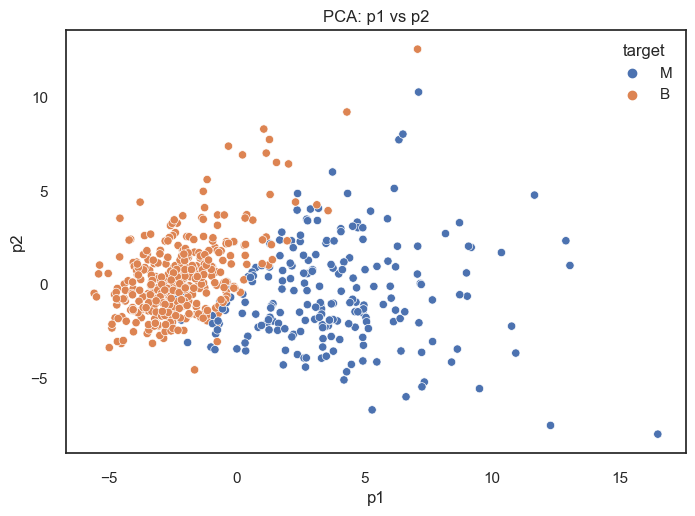

In [114]:
sns.scatterplot(x = "p1", y = "p2", hue = "target", data = pca_data)
plt.title("PCA: p1 vs p2")

The code snippet performs dimensionality reduction using Principal Component Analysis (PCA) on the scaled data. It fits the PCA model to the scaled data and then transforms the data to obtain the reduced dimensions. The transformed data is stored in a DataFrame called `pca_data`, with two columns representing the principal components (p1 and p2) and a target column indicating the class labels. A scatter plot is created using seaborn to visualize the data points in the reduced PCA space, where p1 is plotted on the x-axis, p2 is plotted on the y-axis, and the points are color-coded based on the target variable. This visualization provides insights into the distribution and separation of the data points in the reduced dimensional space obtained through PCA.

In [115]:
dict_ = {"M":0,"B":1}

In [116]:
y = [dict_[elem] for elem in y ]

In [117]:
X_train_pca, X_test_pca, Y_train_pca, Y_test_pca = train_test_split(X_reduced_pac, y, test_size = 0.3, random_state = 42)

In [118]:
grid_pca = KNN_Best_Params(X_train_pca, X_test_pca, Y_train_pca, Y_test_pca)

Best training score: 0.9346153846153846 with parameters: {'n_neighbors': 13, 'p': 2, 'weights': 'uniform'}
Test Score: 0.9473684210526315, Train Score: 0.9396984924623115
CM Test:  [[ 56   7]
 [  2 106]]
CM Train:  [[132  17]
 [  7 242]]


In [119]:
X_train_pca, X_test_pca, Y_train_pca, Y_test_pca = train_test_split(X_reduced_pac, y, test_size = 0.3, random_state = 42)

In [120]:
grid_pca = KNN_Best_Params(X_train_pca, X_test_pca, Y_train_pca, Y_test_pca)

Best training score: 0.9346153846153846 with parameters: {'n_neighbors': 13, 'p': 2, 'weights': 'uniform'}
Test Score: 0.9473684210526315, Train Score: 0.9396984924623115
CM Test:  [[ 56   7]
 [  2 106]]
CM Train:  [[132  17]
 [  7 242]]


Text(0.5, 1.0, "2-Class classification (k = 13, weights = 'uniform' p = 2)")

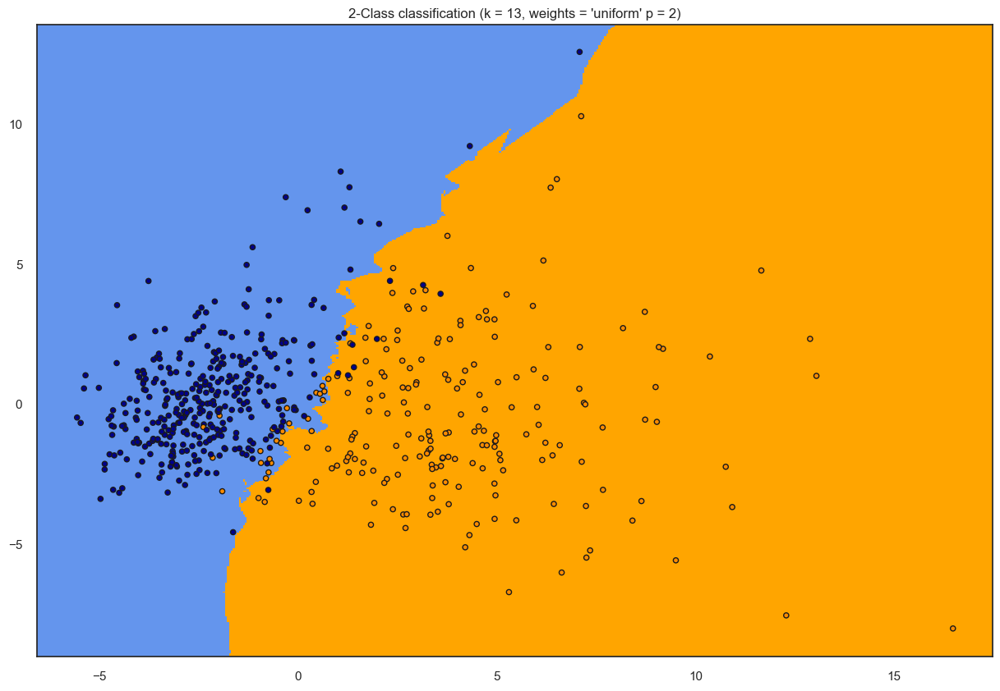

In [121]:

# visualize 
cmap_light = ListedColormap(['orange',  'cornflowerblue'])
cmap_bold = ListedColormap(['darkorange', 'darkblue'])

h = .05 # step size in the mesh
X = X_reduced_pac
x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
                     np.arange(y_min, y_max, h))

Z = grid_pca.predict(np.c_[xx.ravel(), yy.ravel()])

# Put the result into a color plot
Z = Z.reshape(xx.shape)
plt.figure(figsize = (15,10))
plt.pcolormesh(xx, yy, Z, cmap=cmap_light)

# Plot also the training points
plt.scatter(X[:, 0], X[:, 1], c=y, cmap=cmap_bold,
            edgecolor='k', s=20)
plt.xlim(xx.min(), xx.max())
plt.ylim(yy.min(), yy.max())
plt.title("%i-Class classification (k = %i, weights = '%s' p = %s)"
          % (len(np.unique(y)),grid_pca.best_estimator_.n_neighbors, grid_pca.best_estimator_.weights, grid_pca.best_estimator_.p))

The code snippet visualizes the classification boundaries in the reduced PCA space. It uses a meshgrid to create a grid of points and predicts the class labels for each point using a trained classifier (`grid_pca`). The predicted labels are then plotted as a color plot, with different colors representing different classes. The training points are also plotted, with their true labels indicated by color. The plot provides a visual representation of how the classifier separates different classes in the reduced PCA space. The title of the plot includes information about the number of classes, the chosen hyperparameters (k, weights, and p), and serves as a summary of the visualization.

## 5.5 Dimension Reduction Using NCA <a class= 'anchor' id='5.5'></a>

In [122]:
# Create NCA model
nca = NeighborhoodComponentsAnalysis(n_components = 2, random_state = 42)

# Fit
nca.fit(x_scaled, y)

# Transform
X_reduced_nca = nca.transform(x_scaled)

# Created the nca dataframe
nca_data = pd.DataFrame(X_reduced_nca, columns = ["p1","p2"])
nca_data["target"] = y

Text(0.5, 1.0, 'NCA : p1 vs p2')

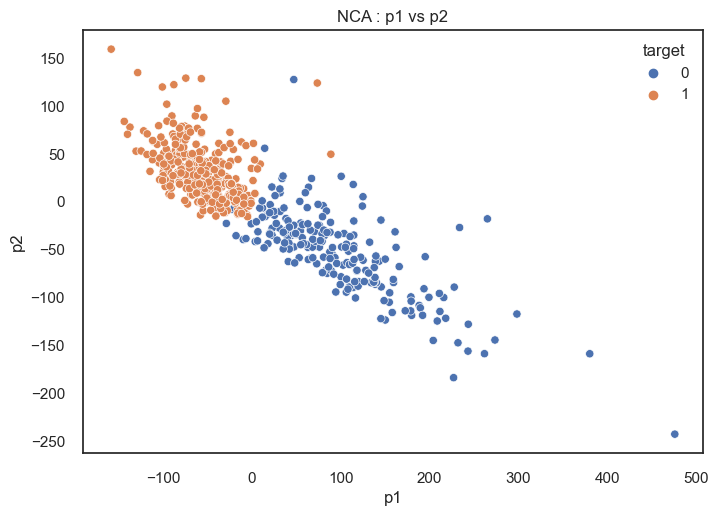

In [123]:
sns.scatterplot(x = "p1", y = "p2", hue = "target", data = nca_data)
plt.title("NCA : p1 vs p2")

In [124]:
X_train_nca, X_test_nca, Y_train_nca, Y_test_nca = train_test_split(X_reduced_nca, y, test_size = 0.3, random_state = 42)

In [125]:
grid_nca = KNN_Best_Params(X_train_nca, X_test_nca, Y_train_nca, Y_test_nca)

Best training score: 0.9874358974358974 with parameters: {'n_neighbors': 4, 'p': 1, 'weights': 'uniform'}
Test Score: 0.9883040935672515, Train Score: 0.9874371859296482
CM Test:  [[ 62   1]
 [  1 107]]
CM Train:  [[145   4]
 [  1 248]]


The code snippet performs dimensionality reduction using Neighborhood Components Analysis (NCA) on the scaled data. It fits the NCA model to the scaled data and then transforms the data to obtain the reduced dimensions. The transformed data is stored in a DataFrame called `nca_data`, with two columns representing the NCA components (p1 and p2) and a target column indicating the class labels. A scatter plot is created using seaborn to visualize the data points in the reduced NCA space, where p1 is plotted on the x-axis, p2 is plotted on the y-axis, and the points are color-coded based on the target variable. This visualization provides insights into the distribution and separation of the data points in the reduced dimensional space obtained through NCA.

Text(0.5, 1.0, "2-Class classification (k = 4, weights = 'uniform' p = 1)")

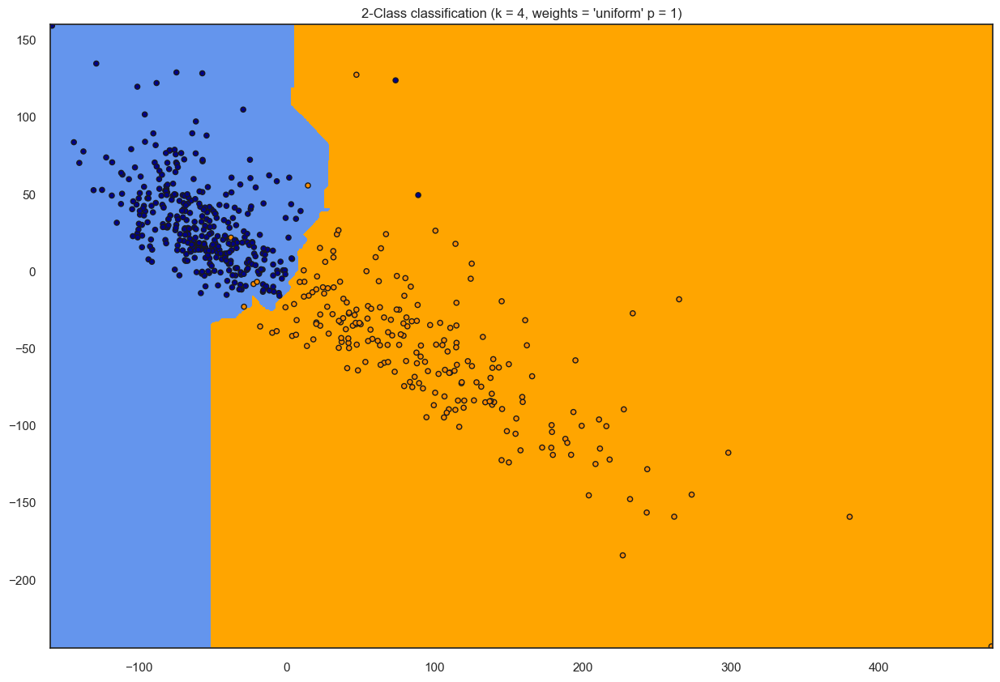

In [126]:
# visualize 
cmap_light = ListedColormap(['orange',  'cornflowerblue'])
cmap_bold = ListedColormap(['darkorange', 'darkblue'])

h = .2 # step size in the mesh
X = X_reduced_nca
x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
                     np.arange(y_min, y_max, h))

Z = grid_nca.predict(np.c_[xx.ravel(), yy.ravel()])

# Put the result into a color plot
Z = Z.reshape(xx.shape)
plt.figure(figsize = (15,10))
plt.pcolormesh(xx, yy, Z, cmap=cmap_light)

# Plot also the training points
plt.scatter(X[:, 0], X[:, 1], c=y, cmap=cmap_bold,
            edgecolor='k', s=20)
plt.xlim(xx.min(), xx.max())
plt.ylim(yy.min(), yy.max())
plt.title("%i-Class classification (k = %i, weights = '%s' p = %s)"
          % (len(np.unique(y)),grid_nca.best_estimator_.n_neighbors, grid_nca.best_estimator_.weights, grid_nca.best_estimator_.p))

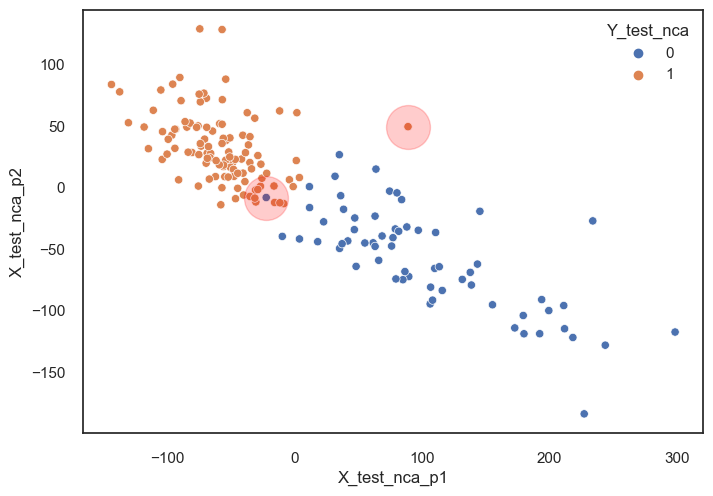

In [127]:
# find wrong decision
knn = KNeighborsClassifier(**grid_nca.best_params_)
knn.fit(X_train_nca,Y_train_nca)
y_pred_nca = knn.predict(X_test_nca)
acc_test_nca = accuracy_score(y_pred_nca,Y_test_nca)
knn.score(X_test_nca,Y_test_nca)

test_data = pd.DataFrame()
test_data["X_test_nca_p1"] = X_test_nca[:,0]
test_data["X_test_nca_p2"] = X_test_nca[:,1]
test_data["y_pred_nca"] = y_pred_nca
test_data["Y_test_nca"] = Y_test_nca

plt.figure()
sns.scatterplot(x="X_test_nca_p1", y="X_test_nca_p2", hue="Y_test_nca",data=test_data)

diff = np.where(y_pred_nca!=Y_test_nca)[0]
plt.scatter(test_data.iloc[diff,0],test_data.iloc[diff,1],label = "Wrong Classified",alpha = 0.2,color = "red",s = 1000)

The code snippet evaluates the performance of the KNN classifier trained on the reduced NCA space. It predicts the class labels for the test data using the trained model and calculates the accuracy score. The test data and their corresponding true and predicted labels are stored in a DataFrame called `test_data`. A scatter plot is created to visualize the test data points in the reduced NCA space, with different colors indicating the true labels. Additionally, the data points that are wrongly classified are highlighted in red. This plot helps identify the instances where the classifier made incorrect predictions. The summary highlights the evaluation and visualization of the KNN classifier's performance on the reduced NCA space.

## End of Analysis.